# Анализ данных ЭЭГ (тестовое задание)

#Описание данных

Данные представляют собой ЭЭГ-записи 17 респондентов, которым демонстрировались 24 разных стимула. Для части меток зафиксированы эмоциональные реакции, измеренные через встроенные алгоритмы Emotiv.
У пилотного респондента (0) '0_RAW DATA', '0_Восприятие инфоповодов (basic pre-processing)'.
У 16 респондентов данные представлены 3 файлами (*"№" - номер респондента*):
1. '№_RAW DATA.csv' - более 100 колонок
    * 0–24 — метаданные и базовые EEG сигналы (Timestamp, EEG.Counter, MarkerIndex и т.д.)
    * 25–55 — CQ / EQ / MC данные (качественные оценки сигнала и действия)
    * 56–100 — PM и FE метрики (психоэмоциональные и мимические показатели)
    * 101–170 — POW — частотные характеристики по каналам (Theta, Alpha, BetaL/H, Gamma)
2. '№_Восприятие инфоповодов_RAW.csv' - сегментированные данные по стимулу,содержит ЭЭГ-данные и PM/FE метрики с разбивкой по отдельным инфоповодам.
3. '№_Восприятие инфоповодов_intervalMarker.csv' - обозначает начало и конец каждого стимула (MarkerIndex, MarkerType, MarkerValueInt) для дальнейшего анализа реакций.

## Загрузка и предобработка данных

In [1]:
! pip install mne -q
!pip install xlsxwriter -q

In [2]:
import os
import zipfile
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne

from scipy import stats
from scipy import interpolate
from glob import glob
from google.colab import drive
from mne.preprocessing import ICA

In [3]:
PATH = '/content/drive/MyDrive/test_task/data/EEG RAW DATA (INFOPOVODI)'

In [4]:
drive.mount('/content/drive')
os.makedirs('/content/drive/MyDrive/test_task/data', exist_ok=True)

zip_path = '/content/drive/MyDrive/test_task/EEG RAW DATA (INFOPOVODI).zip'
extract_path ='/content/drive/MyDrive/test_task/data'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Извлечем данные в словарь, где верхний ключ - номер респондента, нижний ключ - названия таблиц - raw, basic, perception_raw, marker.

In [5]:
import os
import pandas as pd

def load_csv(PATH, remove_first=False, sep=','):
    """
    Загружает CSV Emotiv, удаляет первую строку, если указано remove_first,
    но сохраняет названия столбцов. Разделитель sep можно задавать.
    """
    if remove_first:
        df = pd.read_csv(PATH, sep=sep, quotechar='"', engine='python', skiprows=1)
    else:
        df = pd.read_csv(PATH, sep=sep, quotechar='"', engine='python')

    df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
    df.columns = [c.strip() for c in df.columns]
    return df

def load_all_subjects(data_dir):
    """
    Загружает все данные респондентов из папки data_dir.
    Для респондента 1 raw файл читается с sep=';'.
    Возвращает словарь словарей {subject_id: {dataframes}}.
    """
    subjects = {}
    all_files = sorted(os.listdir(data_dir))
    subject_ids = sorted({f.split('_')[0] for f in all_files if f.endswith('.csv')})

    for sid in subject_ids:
        subj_files = [f for f in all_files if f.startswith(sid + '_')]

        if sid == '0':
            raw_file = [f for f in subj_files if 'RAW DATA' in f and 'восприятие' not in f.lower()][0]
            basic_file = [f for f in subj_files if 'basic_pre_processing' in f.lower()][0]

            subjects[sid] = {
                'pilot': True,
                'raw': load_csv(os.path.join(data_dir, raw_file), remove_first=True),
                'basic': pd.read_csv(os.path.join(data_dir, basic_file))
            }

        else:
            raw_file = [f for f in subj_files if 'RAW DATA' in f and 'восприятие' not in f.lower()][0]
            perception_raw_file = [f for f in subj_files if 'восприятие инфоповодов' in f.lower() and 'intervalmarker' not in f.lower()][0]
            marker_file = [f for f in subj_files if 'intervalmarker' in f.lower()][0]

            sep_raw = ';' if sid == '1' else ','

            subjects[sid] = {
                'pilot': False,
                'raw': load_csv(os.path.join(data_dir, raw_file), remove_first=True, sep=sep_raw),
                'perception_raw': load_csv(os.path.join(data_dir, perception_raw_file), remove_first=True),
                'marker': pd.read_csv(os.path.join(data_dir, marker_file))
            }

        print(f'Респондент {sid} загружен')

    return subjects

In [6]:
subjects_data = load_all_subjects(PATH)


/tmp/ipython-input-1192104568.py:38: DtypeWarning: Columns (66,69,70,71) have mixed types. Specify dtype option on import or set low_memory=False.
  'basic': pd.read_csv(os.path.join(data_dir, basic_file))


Респондент 0 загружен
Респондент 1 загружен
Респондент 10 загружен
Респондент 11 загружен
Респондент 12 загружен
Респондент 13 загружен
Респондент 14 загружен
Респондент 15 загружен
Респондент 16 загружен
Респондент 2 загружен
Респондент 3 загружен
Респондент 4 загружен
Респондент 5 загружен
Респондент 6 загружен
Респондент 7 загружен
Респондент 8 загружен
Респондент 9 загружен


In [7]:
for sid, data in subjects_data.items():
    print(f'--- Респондент {sid} ---')
    print('Pilot:', data['pilot'])

    for key in ['raw', 'basic', 'perception_raw', 'marker']:
        if key in data:
            df = data[key]
            print(f'{key} DataFrame shape: {df.shape}')
            print(f'{key} columns: {list(df)}')
            display(df.head())

--- Респондент 0 ---
Pilot: True
raw DataFrame shape: (170060, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Exc

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743078e+09,1.743078e+09,20.0,0.0,4325.641113,4314.358887,4338.461426,4328.205078,4375.897461,4293.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743078e+09,1.743078e+09,21.0,0.0,4330.769043,4320.000000,4336.410156,4333.333496,4374.358887,4293.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743078e+09,1.743078e+09,22.0,0.0,4344.615234,4328.205078,4345.641113,4342.563965,4381.025879,4294.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743078e+09,1.743078e+09,23.0,0.0,4350.769043,4328.205078,4354.358887,4347.692383,4383.077148,4297.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743078e+09,1.743078e+09,24.0,0.0,4344.615234,4325.128418,4348.717773,4345.128418,4382.051270,4298.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


basic DataFrame shape: (162266, 72)
basic columns: ['index', 'timestamp', 'latency__desc', 'originaltimestamp', 'eeg.counter', 'eeg.interpolated', 'eeg.af3', 'eeg.f7', 'eeg.f3', 'eeg.fc5', 'eeg.t7', 'eeg.p7', 'eeg.o1', 'eeg.o2', 'eeg.p8', 'eeg.t8', 'eeg.fc6', 'eeg.f4', 'eeg.f8', 'eeg.af4', 'eeg.rawcq', 'eeg.battery', 'cq.af3', 'cq.f7', 'cq.f3', 'cq.fc5', 'cq.t7', 'cq.p7', 'cq.o1', 'cq.o2', 'cq.p8', 'cq.t8', 'cq.fc6', 'cq.f4', 'cq.f8', 'cq.af4', 'cq.overall', 'sq.overallsensorquality', 'sq.af3.signalquality', 'sq.af3.rms', 'sq.f7.signalquality', 'sq.f7.rms', 'sq.f3.signalquality', 'sq.f3.rms', 'sq.fc5.signalquality', 'sq.fc5.rms', 'sq.t7.signalquality', 'sq.t7.rms', 'sq.p7.signalquality', 'sq.p7.rms', 'sq.o1.signalquality', 'sq.o1.rms', 'sq.o2.signalquality', 'sq.o2.rms', 'sq.p8.signalquality', 'sq.p8.rms', 'sq.t8.signalquality', 'sq.t8.rms', 'sq.fc6.signalquality', 'sq.fc6.rms', 'sq.f4.signalquality', 'sq.f4.rms', 'sq.f8.signalquality', 'sq.f8.rms', 'sq.af4.signalquality', 'sq.af4.rms'

,index,timestamp,latency__desc,originaltimestamp,eeg.counter,eeg.interpolated,eeg.af3,eeg.f7,eeg.f3,eeg.fc5,...,sq.f8.signalquality,sq.f8.rms,sq.af4.signalquality,sq.af4.rms,marker_label__desc,phase_name__desc,subject_id,record_title,record_id,session_id
0,8,1.743078e+09,0.000000,1.743078e+09,93.0,0.0,-11.961625,-25.801397,7.839505,-21.308402,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
1,9,1.743078e+09,0.007808,1.743078e+09,94.0,0.0,-8.980355,-27.039876,3.589829,-22.452628,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
2,10,1.743078e+09,0.015617,1.743078e+09,95.0,0.0,-9.839390,-34.925894,0.510374,-29.994116,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
3,11,1.743078e+09,0.023425,1.743078e+09,96.0,0.0,-11.261012,-41.745099,2.713795,-31.318291,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
4,12,1.743078e+09,0.031233,1.743078e+09,97.0,0.0,-10.693833,-34.739334,1.690295,-26.729813,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128


--- Респондент 1 ---
Pilot: False
raw DataFrame shape: (141087, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Ex

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743410e+09,1.743410e+09,76.0,0.0,4291.282227,4292.307617,4261.025879,4301.025879,4316.410156,4278.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743410e+09,1.743410e+09,77.0,0.0,4295.384766,4297.436035,4263.077148,4302.051270,4324.102539,4280.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743410e+09,1.743410e+09,78.0,0.0,4294.871582,4283.077148,4263.077148,4297.948730,4326.153809,4278.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743410e+09,1.743410e+09,79.0,0.0,4290.256348,4278.461426,4261.025879,4291.282227,4323.077148,4278.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743410e+09,1.743410e+09,80.0,0.0,4295.897461,4302.051270,4263.077148,4301.025879,4323.589844,4280.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (136739, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743410e+09,1.743410e+09,110.0,0.0,4301.025879,4280.512695,4322.563965,4312.820313,4339.487305,4266.153809,...,5.258474,1.235466,1.149829,0.59383,0.220764,4.894125,1.109973,1.184868,0.553299,0.233867;;;;
1,1.743410e+09,1.743410e+09,111.0,0.0,4303.589844,4281.538574,4317.948730,4312.820313,4340.512695,4266.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743410e+09,1.743410e+09,112.0,0.0,4294.871582,4280.512695,4311.282227,4310.256348,4337.948730,4264.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743410e+09,1.743410e+09,113.0,0.0,4292.820313,4283.077148,4314.358887,4312.307617,4339.487305,4266.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743410e+09,1.743410e+09,114.0,0.0,4306.666504,4289.230957,4323.589844,4322.051270,4343.077148,4266.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.257672,3.341933,sensor_check,true,-1,1.743410e+09,1
1,3.599605,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743410e+09,2
2,3.599605,9.916485,phase_calibration,calibration,-1,1.743410e+09,3
3,3.599605,9.916485,sound_check,true,-1,1.743410e+09,4
4,13.516090,78.910227,phase_Instructions,91374,-1,1.743410e+09,5


--- Респондент 10 ---
Pilot: False
raw DataFrame shape: (144609, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744704e+09,1.744704e+09,16.0,0.0,4325.897461,4282.051270,4329.230957,4331.538574,4339.487305,4282.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744704e+09,1.744704e+09,17.0,0.0,4325.897461,4285.128418,4328.461426,4329.358887,4327.692383,4280.512695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744704e+09,1.744704e+09,18.0,0.0,4315.000000,4278.974121,4314.230957,4313.077148,4308.205078,4277.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744704e+09,1.744704e+09,19.0,0.0,4316.666504,4277.179688,4314.743652,4315.000000,4320.512695,4276.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744704e+09,1.744704e+09,20.0,0.0,4326.025879,4284.487305,4327.051270,4329.102539,4336.025879,4276.410156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (141383, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744705e+09,1.744705e+09,97.0,0.0,4187.051270,3893.718018,4176.794922,4171.538574,4177.563965,4116.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744705e+09,1.744705e+09,98.0,0.0,4191.666504,3896.794922,4182.563965,4175.512695,4184.230957,4122.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744705e+09,1.744705e+09,99.0,0.0,4180.641113,3900.897461,4175.128418,4173.333496,4181.025879,4134.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744705e+09,1.744705e+09,100.0,0.0,4165.000000,3891.538574,4166.282227,4163.846191,4169.615234,4122.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744705e+09,1.744705e+09,101.0,0.0,4168.846191,3881.281982,4170.000000,4168.333496,4168.846191,4113.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.101506,48.746498,sensor_check,true,-1,1.744705e+09,1
1,48.848004,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744705e+09,2
2,48.848004,35.652172,phase_calibration,calibration,-1,1.744705e+09,3
3,48.848004,35.652172,sound_check,true,-1,1.744705e+09,4
4,84.500176,80.166634,phase_Instructions,91374,-1,1.744705e+09,5


--- Респондент 11 ---
Pilot: False
raw DataFrame shape: (144664, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744715e+09,1.744715e+09,112.0,0.0,4347.307617,4317.307617,4362.692383,4337.179688,4379.230957,4335.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744715e+09,1.744715e+09,113.0,0.0,4347.179688,4319.871582,4365.641113,4349.358887,4387.051270,4337.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744715e+09,1.744715e+09,114.0,0.0,4339.102539,4311.922852,4352.436035,4324.871582,4381.538574,4325.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744715e+09,1.744715e+09,115.0,0.0,4344.230957,4313.205078,4354.615234,4322.563965,4379.358887,4323.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744715e+09,1.744715e+09,116.0,0.0,4344.102539,4316.922852,4359.102539,4338.717773,4380.384766,4327.307617,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (141505, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744715e+09,1.744715e+09,82.0,0.0,4302.563965,4264.487305,4287.307617,4296.666504,4363.205078,4304.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744715e+09,1.744715e+09,83.0,0.0,4310.512695,4280.384766,4296.025879,4313.717773,4368.461426,4311.410156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744715e+09,1.744715e+09,84.0,0.0,4306.538574,4266.410156,4291.666504,4311.794922,4363.974121,4305.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744715e+09,1.744715e+09,85.0,0.0,4300.641113,4260.897461,4282.436035,4306.025879,4354.871582,4291.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744715e+09,1.744715e+09,86.0,0.0,4308.333496,4276.025879,4289.615234,4311.794922,4357.692383,4296.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.109315,3.802614,sensor_check,true,-1,1.744715e+09,1
1,3.911929,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744715e+09,2
2,3.911929,12.118391,sound_check,true,-1,1.744715e+09,3
3,3.911929,12.118391,phase_calibration,calibration,-1,1.744715e+09,4
4,16.030320,80.713792,phase_Instructions,91374,-1,1.744715e+09,5


--- Респондент 12 ---
Pilot: False
raw DataFrame shape: (161602, 182)
raw columns: ['Timestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.

,Timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744724e+09,96.0,0.0,4340.897461,4344.871582,4341.025879,4363.461426,4391.410156,4328.974121,4305.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744724e+09,97.0,0.0,4342.563965,4340.384766,4345.897461,4371.922852,4401.282227,4328.589844,4306.538574,...,11.341942,8.888776,6.297992,4.309634,4.173475,1.048547,1.464248,1.29781,0.144474,0.094577;;;;;
2,1.744724e+09,98.0,0.0,4348.846191,4347.692383,4351.922852,4364.230957,4402.179688,4326.025879,4304.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744724e+09,99.0,0.0,4342.436035,4349.487305,4349.230957,4348.205078,4397.051270,4327.563965,4301.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744724e+09,100.0,0.0,4330.256348,4340.000000,4344.102539,4335.128418,4393.461426,4326.666504,4301.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (156976, 182)
perception_raw columns: ['Timestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max

,Timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744724e+09,45.0,0.0,4283.846191,4298.205078,4300.384766,4325.769043,4344.743652,4272.051270,4245.641113,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744724e+09,46.0,0.0,4284.358887,4328.205078,4300.769043,4317.179688,4345.641113,4275.000000,4253.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744724e+09,47.0,0.0,4278.974121,4311.666504,4293.077148,4312.051270,4340.256348,4269.871582,4250.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744724e+09,48.0,0.0,4272.820313,4285.128418,4284.871582,4301.282227,4335.128418,4271.538574,4244.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744724e+09,49.0,0.0,4272.436035,4274.487305,4284.743652,4300.641113,4337.051270,4278.461426,4248.205078,...,62.456348,10.813889,6.456573,4.372769,4.43068,7.4204,1.449875,0.269365,0.069925,0.124595;;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.108718,25.541455,sensor_check,true,-1,1.744724e+09,1
1,25.650173,3.731244,phase_calibration,calibration,-1,1.744724e+09,2
2,25.650173,3.731244,sound_check,true,-1,1.744724e+09,3
3,25.650173,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744724e+09,4
4,29.381417,85.179687,phase_Instructions,91374,-1,1.744724e+09,5


--- Респондент 13 ---
Pilot: False
raw DataFrame shape: (134882, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744792e+09,1.744792e+09,125.0,0.0,4238.974121,4233.077148,4226.282227,4235.641113,4288.717773,4195.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744792e+09,1.744792e+09,126.0,0.0,4232.051270,4233.333496,4218.077148,4234.871582,4293.077148,4185.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744792e+09,1.744792e+09,127.0,0.0,4234.615234,4230.641113,4231.025879,4234.487305,4292.563965,4185.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744792e+09,1.744792e+09,0.0,0.0,4237.563965,4220.769043,4236.025879,4231.794922,4277.692383,4187.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744792e+09,1.744792e+09,1.0,0.0,4236.538574,4212.051270,4229.487305,4229.871582,4270.512695,4184.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (131240, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744792e+09,1.744792e+09,115.0,0.0,4327.179688,4324.487305,4297.563965,4333.461426,4391.410156,4332.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744792e+09,1.744792e+09,116.0,0.0,4323.333496,4331.794922,4297.820313,4336.538574,4398.077148,4326.922852,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744792e+09,1.744792e+09,117.0,0.0,4317.436035,4329.871582,4297.948730,4335.512695,4385.000000,4321.282227,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744792e+09,1.744792e+09,118.0,0.0,4322.563965,4327.051270,4300.641113,4330.256348,4377.436035,4320.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744792e+09,1.744792e+09,119.0,0.0,4330.512695,4330.769043,4306.153809,4329.871582,4386.410156,4322.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.124932,3.708908,sensor_check,true,-1,1.744792e+09,1
1,3.833840,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744792e+09,2
2,3.833840,4.122744,phase_calibration,calibration,-1,1.744792e+09,3
3,3.833840,4.122744,sound_check,true,-1,1.744792e+09,4
4,7.956584,80.971325,phase_Instructions,91374,-1,1.744792e+09,5


--- Респондент 14 ---
Pilot: False
raw DataFrame shape: (141803, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744799e+09,1.744799e+09,102.0,0.0,4307.820313,4335.512695,4307.051270,4331.794922,4359.487305,4252.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744799e+09,1.744799e+09,103.0,0.0,4302.692383,4321.794922,4305.000000,4326.153809,4358.589844,4257.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744799e+09,1.744799e+09,104.0,0.0,4296.410156,4307.563965,4302.563965,4316.538574,4357.948730,4255.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744799e+09,1.744799e+09,105.0,0.0,4297.051270,4311.410156,4301.666504,4318.461426,4351.410156,4255.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744799e+09,1.744799e+09,106.0,0.0,4306.153809,4323.333496,4308.461426,4331.282227,4350.641113,4261.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (138989, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744799e+09,1.744799e+09,16.0,0.0,4317.307617,4281.922852,4335.384766,4318.077148,4317.948730,4267.948730,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744799e+09,1.744799e+09,17.0,0.0,4322.692383,4285.769043,4338.846191,4318.205078,4321.153809,4265.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744799e+09,1.744799e+09,18.0,0.0,4320.128418,4286.538574,4337.307617,4310.512695,4321.025879,4258.589844,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744799e+09,1.744799e+09,19.0,0.0,4316.025879,4281.282227,4331.922852,4305.641113,4314.871582,4252.563965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744799e+09,1.744799e+09,20.0,0.0,4318.077148,4280.641113,4332.948730,4310.128418,4321.282227,4253.333496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.117123,3.146717,sensor_check,true,-1,1.744799e+09,1
1,3.263840,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744799e+09,2
2,3.263840,17.396734,phase_calibration,calibration,-1,1.744799e+09,3
3,3.263840,17.396734,sound_check,true,-1,1.744799e+09,4
4,20.660574,79.112978,phase_Instructions,91374,-1,1.744799e+09,5


--- Респондент 15 ---
Pilot: False
raw DataFrame shape: (133813, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744803e+09,1.744803e+09,119.0,0.0,4310.769043,4318.077148,4347.179688,4333.461426,4326.025879,4309.743652,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744803e+09,1.744803e+09,120.0,0.0,4316.794922,4333.333496,4355.512695,4331.538574,4328.461426,4310.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744803e+09,1.744803e+09,121.0,0.0,4315.384766,4336.538574,4353.077148,4346.153809,4320.512695,4310.256348,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744803e+09,1.744803e+09,122.0,0.0,4311.410156,4302.692383,4348.717773,4341.794922,4313.589844,4310.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744803e+09,1.744803e+09,123.0,0.0,4311.794922,4290.897461,4353.717773,4318.717773,4317.820313,4309.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (139198, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744803e+09,1.744803e+09,110.0,0.0,4296.922852,4291.538574,4301.025879,4301.025879,4337.051270,4279.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744803e+09,1.744803e+09,111.0,0.0,4298.461426,4289.102539,4302.307617,4300.128418,4338.974121,4280.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744803e+09,1.744803e+09,112.0,0.0,4290.128418,4290.256348,4294.358887,4288.461426,4327.948730,4279.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744803e+09,1.744803e+09,113.0,0.0,4290.384766,4300.641113,4295.897461,4292.692383,4325.897461,4276.794922,...,4.042772,1.000656,0.614195,0.885675,0.451819,4.622429,1.384031,0.678544,1.080856,0.333632;;;;;
4,1.744803e+09,1.744803e+09,114.0,0.0,4300.897461,4299.487305,4305.769043,4298.333496,4329.615234,4276.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.109316,6.808781,sensor_check,true,-1,1.744803e+09,1
1,6.918097,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744803e+09,2
2,6.918097,46.646399,phase_calibration,calibration,-1,1.744803e+09,3
3,6.925905,46.638591,sound_check,true,-1,1.744803e+09,4
4,53.564496,84.391409,phase_Instructions,91374,-1,1.744803e+09,5


--- Респондент 16 ---
Pilot: False
raw DataFrame shape: (134110, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744808e+09,1.744808e+09,125.0,0.0,4276.025879,4256.282227,4310.256348,4301.025879,4332.436035,4264.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744808e+09,1.744808e+09,126.0,0.0,4277.307617,4254.615234,4307.692383,4299.743652,4324.871582,4265.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744808e+09,1.744808e+09,127.0,0.0,4277.692383,4243.974121,4299.487305,4299.743652,4309.871582,4268.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744808e+09,1.744808e+09,0.0,0.0,4273.077148,4239.230957,4298.846191,4295.128418,4305.000000,4266.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744808e+09,1.744808e+09,1.0,0.0,4261.282227,4239.487305,4295.897461,4289.743652,4326.666504,4266.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (130777, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744808e+09,1.744808e+09,67.0,0.0,4316.025879,4226.666504,4350.000000,4321.153809,4349.615234,4289.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744808e+09,1.744808e+09,68.0,0.0,4312.948730,4219.743652,4344.871582,4323.589844,4346.922852,4286.282227,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744808e+09,1.744808e+09,69.0,0.0,4311.025879,4225.000000,4341.153809,4322.179688,4328.077148,4287.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744808e+09,1.744808e+09,70.0,0.0,4304.230957,4229.358887,4337.179688,4318.205078,4327.948730,4284.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744808e+09,1.744808e+09,71.0,0.0,4301.794922,4218.205078,4331.410156,4316.538574,4322.948730,4273.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.124932,2.358082,sensor_check,true,-1,1.744808e+09,1
1,2.483014,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744808e+09,2
2,2.483014,4.380411,phase_calibration,calibration,-1,1.744808e+09,3
3,2.483014,4.380411,sound_check,true,-1,1.744808e+09,4
4,6.863425,79.003572,phase_Instructions,91374,-1,1.744808e+09,5


--- Респондент 2 ---
Pilot: False
raw DataFrame shape: (139980, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Ex

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743418e+09,1.743418e+09,106.0,0.0,4300.000000,4273.333496,4306.153809,4288.717773,4347.179688,4278.974121,...,1.244762,2.408562,1.310056,0.627593,0.58757,2.627824,3.209563,1.237062,0.627467,0.250103;;;;
1,1.743418e+09,1.743418e+09,107.0,0.0,4304.615234,4277.436035,4307.692383,4296.410156,4346.666504,4278.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743418e+09,1.743418e+09,108.0,0.0,4316.922852,4288.717773,4316.922852,4310.256348,4347.179688,4288.205078,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743418e+09,1.743418e+09,109.0,0.0,4327.179688,4299.487305,4327.179688,4319.487305,4350.256348,4296.922852,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743418e+09,1.743418e+09,110.0,0.0,4328.717773,4302.051270,4328.205078,4318.974121,4357.436035,4295.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


perception_raw DataFrame shape: (137655, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743418e+09,1.743418e+09,50.0,0.0,4309.743652,4311.282227,4321.538574,4326.666504,4352.307617,4309.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743418e+09,1.743418e+09,51.0,0.0,4313.333496,4311.794922,4323.077148,4325.128418,4353.333496,4304.615234,...,1.683649,0.520386,0.296042,0.736395,0.691074,2.657117,1.362541,0.492402,0.623749,0.257759;;;;
2,1.743418e+09,1.743418e+09,52.0,0.0,4312.820313,4310.256348,4319.487305,4323.589844,4357.436035,4303.589844,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743418e+09,1.743418e+09,53.0,0.0,4313.846191,4313.333496,4318.974121,4327.692383,4357.948730,4307.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743418e+09,1.743418e+09,54.0,0.0,4318.974121,4317.948730,4329.743652,4334.871582,4364.102539,4310.256348,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.156165,5.051928,sensor_check,true,-1,1.743418e+09,1
1,5.208093,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743418e+09,2
2,5.208093,10.806596,phase_calibration,calibration,-1,1.743418e+09,3
3,5.208093,10.806596,sound_check,true,-1,1.743418e+09,4
4,16.022497,80.893311,phase_Instructions,91374,-1,1.743418e+09,5


--- Респондент 3 ---
Pilot: False
raw DataFrame shape: (153508, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Ex

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743427e+09,1.743427e+09,120.0,0.0,5517.436035,5854.358887,5000.000000,5949.743652,3888.718018,5134.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743427e+09,1.743427e+09,121.0,0.0,5457.948730,5752.307617,4958.974121,5884.615234,3864.102539,5084.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743427e+09,1.743427e+09,122.0,0.0,5435.384766,5692.307617,4937.948730,5883.589844,3928.718018,5051.282227,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743427e+09,1.743427e+09,123.0,0.0,5423.077148,5661.025879,4914.358887,5829.230957,4015.384521,5020.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743427e+09,1.743427e+09,124.0,0.0,5404.102539,5601.025879,4875.897461,5755.897461,4025.128174,4978.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


perception_raw DataFrame shape: (158537, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743427e+09,1.743427e+09,121.0,0.0,4089.743652,4288.205078,4304.615234,4355.384766,4309.230957,4293.333496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743427e+09,1.743427e+09,122.0,0.0,4100.000000,4294.358887,4315.384766,4368.205078,4313.333496,4297.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743427e+09,1.743427e+09,123.0,0.0,4105.641113,4298.461426,4311.794922,4368.205078,4313.846191,4296.922852,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743427e+09,1.743427e+09,124.0,0.0,4104.102539,4295.384766,4298.461426,4356.410156,4311.282227,4293.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743427e+09,1.743427e+09,125.0,0.0,4104.102539,4291.282227,4293.846191,4350.769043,4313.333496,4294.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.093698,89.802404,sensor_check,true,-1,1.743427e+09,1
1,89.896102,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743428e+09,2
2,89.896102,16.818918,phase_calibration,calibration,-1,1.743428e+09,3
3,89.903910,16.811110,sound_check,true,-1,1.743428e+09,4
4,106.715020,90.114733,phase_Instructions,91374,-1,1.743428e+09,5


--- Респондент 4 ---
Pilot: False
raw DataFrame shape: (146502, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Ex

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743495e+09,1.743495e+09,31.0,0.0,4326.666504,4302.051270,3951.794922,4289.743652,4374.358887,4294.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743495e+09,1.743495e+09,32.0,0.0,4326.666504,4311.282227,3957.435791,4290.256348,4374.871582,4294.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743495e+09,1.743495e+09,33.0,0.0,4327.179688,4311.794922,3958.974365,4290.256348,4367.692383,4290.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743495e+09,1.743495e+09,34.0,0.0,4328.205078,4307.692383,3958.461426,4288.205078,4364.102539,4290.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743495e+09,1.743495e+09,35.0,0.0,4324.615234,4305.128418,3954.871826,4282.051270,4365.641113,4292.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


perception_raw DataFrame shape: (143580, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743495e+09,1.743495e+09,37.0,0.0,4311.794922,4308.205078,4323.589844,4324.615234,4353.846191,4310.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743495e+09,1.743495e+09,38.0,0.0,4306.666504,4296.922852,4320.000000,4321.025879,4346.666504,4307.692383,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743495e+09,1.743495e+09,39.0,0.0,4306.153809,4298.974121,4324.615234,4323.589844,4351.282227,4309.743652,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743495e+09,1.743495e+09,40.0,0.0,4310.256348,4305.641113,4329.230957,4325.641113,4358.974121,4311.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743495e+09,1.743495e+09,41.0,0.0,4305.128418,4300.512695,4324.102539,4320.512695,4353.333496,4305.641113,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.179589,11.977788,sensor_check,true,-1,1.743495e+09,1
1,12.157377,6.457387,phase_calibration,calibration,-1,1.743495e+09,2
2,12.157377,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743495e+09,3
3,12.157377,6.457387,sound_check,true,-1,1.743495e+09,4
4,18.622572,115.850360,phase_Instructions,91374,-1,1.743495e+09,5


--- Респондент 5 ---
Pilot: False
raw DataFrame shape: (148427, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Ex

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743507e+09,1.743507e+09,54.0,0.0,4345.641113,4316.922852,4344.102539,4343.589844,4360.512695,4327.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743507e+09,1.743507e+09,55.0,0.0,4341.025879,4314.871582,4333.333496,4334.358887,4354.871582,4325.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743507e+09,1.743507e+09,56.0,0.0,4339.487305,4325.128418,4325.641113,4345.641113,4354.358887,4317.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743507e+09,1.743507e+09,57.0,0.0,4346.666504,4333.846191,4333.333496,4349.743652,4358.974121,4312.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743507e+09,1.743507e+09,58.0,0.0,4352.820313,4328.717773,4336.922852,4338.461426,4360.000000,4317.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


perception_raw DataFrame shape: (146026, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.743507e+09,1.743507e+09,3.0,0.0,4332.307617,4345.128418,4331.794922,4306.153809,4381.025879,4324.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.743507e+09,1.743507e+09,4.0,0.0,4328.717773,4329.743652,4336.922852,4322.563965,4381.538574,4326.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.743507e+09,1.743507e+09,5.0,0.0,4327.692383,4312.307617,4332.307617,4314.871582,4378.974121,4327.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.743507e+09,1.743507e+09,6.0,0.0,4330.769043,4317.948730,4325.128418,4303.589844,4373.333496,4321.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.743507e+09,1.743507e+09,7.0,0.0,4330.256348,4329.743652,4327.692383,4312.820313,4371.794922,4315.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.148356,64.675600,sensor_check,true,-1,1.743507e+09,1
1,64.823956,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743507e+09,2
2,64.823956,2.631375,phase_calibration,calibration,-1,1.743507e+09,3
3,64.823956,2.631375,sound_check,true,-1,1.743507e+09,4
4,67.455331,4.466310,phase_Instructions,91374,-1,1.743507e+09,5


--- Респондент 6 ---
Pilot: False
raw DataFrame shape: (152588, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Ex

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.744365e+09,1.744365e+09,24.0,0.0,4342.563965,4376.922852,4335.897461,4336.410156,4425.641113,4368.205078,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.744365e+09,1.744365e+09,25.0,0.0,4342.563965,4376.922852,4331.282227,4338.974121,4432.820313,4364.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.744365e+09,1.744365e+09,26.0,0.0,4332.820313,4369.743652,4325.128418,4331.794922,4427.179688,4357.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.744365e+09,1.744365e+09,27.0,0.0,4325.641113,4360.512695,4321.538574,4325.641113,4416.410156,4354.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.744365e+09,1.744365e+09,28.0,0.0,4333.333496,4361.538574,4322.563965,4331.282227,4411.282227,4347.692383,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


perception_raw DataFrame shape: (147595, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;
0,1.744365e+09,1.744365e+09,103.0,0.0,4317.948730,4333.846191,4315.897461,4340.512695,4213.846191,4333.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
1,1.744365e+09,1.744365e+09,104.0,0.0,4327.692383,4351.282227,4324.615234,4345.641113,4222.051270,4344.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
2,1.744365e+09,1.744365e+09,105.0,0.0,4343.589844,4366.666504,4335.384766,4356.922852,4235.897461,4351.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
3,1.744365e+09,1.744365e+09,106.0,0.0,4343.077148,4369.743652,4340.000000,4358.461426,4234.871582,4359.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;
4,1.744365e+09,1.744365e+09,107.0,0.0,4339.487305,4369.230957,4343.589844,4355.384766,4228.205078,4361.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.101508,3.459052,sensor_check,true,-1,1.744365e+09,1
1,3.560560,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744365e+09,2
2,3.560560,53.611412,phase_calibration,calibration,-1,1.744365e+09,3
3,3.560560,53.611412,sound_check,true,-1,1.744365e+09,4
4,57.171972,80.682598,phase_Instructions,91374,-1,1.744365e+09,5


--- Респондент 7 ---
Pilot: False
raw DataFrame shape: (139407, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744621e+09,1.744621e+09,65.0,0.0,4291.282227,4296.794922,4311.025879,4306.794922,4374.487305,4238.589844,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744621e+09,1.744621e+09,66.0,0.0,4301.025879,4294.871582,4314.743652,4310.256348,4372.820313,4234.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744621e+09,1.744621e+09,67.0,0.0,4297.051270,4287.179688,4313.205078,4308.461426,4370.000000,4224.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744621e+09,1.744621e+09,68.0,0.0,4282.051270,4280.000000,4302.948730,4296.153809,4343.846191,4212.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744621e+09,1.744621e+09,69.0,0.0,4260.897461,4252.820313,4283.205078,4274.487305,4317.563965,4233.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (128485, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744621e+09,1.744621e+09,107.0,0.0,4298.461426,4287.563965,4318.077148,4312.179688,4338.333496,4268.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744621e+09,1.744621e+09,108.0,0.0,4295.000000,4287.179688,4311.666504,4316.025879,4321.025879,4267.563965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744621e+09,1.744621e+09,109.0,0.0,4295.512695,4298.846191,4318.974121,4318.846191,4340.897461,4306.025879,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744621e+09,1.744621e+09,110.0,0.0,4323.846191,4332.948730,4351.794922,4331.538574,4368.077148,4314.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744621e+09,1.744621e+09,111.0,0.0,4338.333496,4340.384766,4361.153809,4340.769043,4354.743652,4292.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.117124,9.026316,sensor_check,true,-1,1.744621e+09,1
1,9.143440,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744621e+09,2
2,9.143440,7.152340,phase_calibration,calibration,-1,1.744621e+09,3
3,9.143440,7.152340,sound_check,true,-1,1.744621e+09,4
4,16.295780,86.569867,phase_Instructions,91374,-1,1.744621e+09,5


--- Респондент 8 ---
Pilot: False
raw DataFrame shape: (135522, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744630e+09,1.744630e+09,111.0,0.0,4302.436035,4224.871582,4323.589844,4305.641113,4378.077148,4277.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744630e+09,1.744630e+09,112.0,0.0,4300.769043,4233.589844,4323.077148,4301.922852,4391.794922,4286.410156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744630e+09,1.744630e+09,113.0,0.0,4312.563965,4249.615234,4332.436035,4314.743652,4347.820313,4293.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744630e+09,1.744630e+09,114.0,0.0,4313.974121,4244.871582,4330.641113,4317.307617,4333.974121,4279.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744630e+09,1.744630e+09,115.0,0.0,4304.871582,4231.153809,4321.666504,4302.307617,4357.948730,4272.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (128831, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744630e+09,1.744630e+09,18.0,0.0,4245.128418,4242.692383,4254.615234,4188.846191,4476.922852,4222.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744630e+09,1.744630e+09,19.0,0.0,4257.820313,4255.128418,4267.051270,4217.948730,4457.436035,4228.717773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744630e+09,1.744630e+09,20.0,0.0,4249.871582,4246.410156,4255.128418,4216.025879,4424.358887,4221.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744630e+09,1.744630e+09,21.0,0.0,4254.487305,4246.794922,4261.794922,4215.128418,4407.948730,4231.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744630e+09,1.744630e+09,22.0,0.0,4267.179688,4251.794922,4276.922852,4228.974121,4380.769043,4238.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.187398,7.355337,sensor_check,true,-1,1.744630e+09,1
1,7.542735,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744630e+09,2
2,7.542735,2.334656,phase_calibration,calibration,-1,1.744630e+09,3
3,7.542735,2.334656,sound_check,true,-1,1.744630e+09,4
4,9.877391,90.301997,phase_Instructions,91374,-1,1.744630e+09,5


--- Респондент 9 ---
Pilot: False
raw DataFrame shape: (137660, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744637e+09,1.744637e+09,7.0,0.0,4445.000000,4395.512695,4400.384766,4414.358887,4400.256348,4425.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744637e+09,1.744637e+09,8.0,0.0,4439.358887,4390.384766,4393.333496,4407.692383,4406.282227,4424.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
2,1.744637e+09,1.744637e+09,9.0,0.0,4442.051270,4392.307617,4395.384766,4408.077148,4405.641113,4438.717773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744637e+09,1.744637e+09,10.0,0.0,4440.641113,4388.974121,4392.948730,4406.282227,4397.692383,4435.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744637e+09,1.744637e+09,11.0,0.0,4436.794922,4388.205078,4386.410156,4402.307617,4415.128418,4412.563965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


perception_raw DataFrame shape: (133750, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma;;;;;
0,1.744637e+09,1.744637e+09,50.0,0.0,4355.128418,4363.846191,4349.102539,4361.153809,4424.871582,4390.256348,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
1,1.744637e+09,1.744637e+09,51.0,0.0,4354.102539,4361.666504,4351.153809,4365.256348,4419.871582,4390.769043,...,33.078941,4.404392,2.603703,0.54793,0.355601,7.605561,2.42426,1.810592,0.659896,0.428770;;;;;
2,1.744637e+09,1.744637e+09,52.0,0.0,4358.077148,4366.153809,4353.589844,4367.948730,4407.948730,4385.512695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
3,1.744637e+09,1.744637e+09,53.0,0.0,4359.743652,4371.025879,4353.333496,4363.333496,4409.487305,4391.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;
4,1.744637e+09,1.744637e+09,54.0,0.0,4360.384766,4370.128418,4355.256348,4366.153809,4421.410156,4397.948730,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,;;;;;


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.117123,11.111102,sensor_check,true,-1,1.744637e+09,1
1,11.228225,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744637e+09,2
2,11.228225,16.428503,phase_calibration,calibration,-1,1.744637e+09,3
3,11.228225,16.428503,sound_check,true,-1,1.744637e+09,4
4,27.656728,108.198557,phase_Instructions,91374,-1,1.744637e+09,5


Исправим оставшиеся неточности. Во всех датафреймах колонка 'POW.AF4.Gamma;;;;'. Удалим ;;;; из названия колонки и числовых значений, строки с содержанием ';;;;' заменим на NaN.

In [8]:
def clean_gamma_column(subjects_data):
    for sid, data_dict in subjects_data.items():
        for key, df in data_dict.items():
            if key == 'pilot' or not isinstance(df, pd.DataFrame):
                continue

            for col in df.columns:
                if col.startswith('POW.AF4.Gamma'):
                    df.rename(columns={col: 'POW.AF4.Gamma'}, inplace=True)

                    cleaned_values = []
                    for val in df['POW.AF4.Gamma']:
                        try:
                            cleaned_values.append(float(val))
                        except (ValueError, TypeError):
                            cleaned_values.append(float('nan'))
                    df['POW.AF4.Gamma'] = cleaned_values

    return subjects_data

subjects_data = clean_gamma_column(subjects_data)

Проверим.

In [9]:
for sid, data in subjects_data.items():
    print(f'- Респондент {sid} -')
    print('Pilot:', data['pilot'])

    for key in ['raw', 'basic', 'perception_raw', 'marker']:
        if key in data:
            df = data[key]
            print(f'{key} DataFrame shape: {df.shape}')
            print(f'{key} columns: {list(df)}')
            display(df.head())

- Респондент 0 -
Pilot: True
raw DataFrame shape: (170060, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitem

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743078e+09,1.743078e+09,20.0,0.0,4325.641113,4314.358887,4338.461426,4328.205078,4375.897461,4293.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743078e+09,1.743078e+09,21.0,0.0,4330.769043,4320.000000,4336.410156,4333.333496,4374.358887,4293.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743078e+09,1.743078e+09,22.0,0.0,4344.615234,4328.205078,4345.641113,4342.563965,4381.025879,4294.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743078e+09,1.743078e+09,23.0,0.0,4350.769043,4328.205078,4354.358887,4347.692383,4383.077148,4297.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743078e+09,1.743078e+09,24.0,0.0,4344.615234,4325.128418,4348.717773,4345.128418,4382.051270,4298.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


basic DataFrame shape: (162266, 72)
basic columns: ['index', 'timestamp', 'latency__desc', 'originaltimestamp', 'eeg.counter', 'eeg.interpolated', 'eeg.af3', 'eeg.f7', 'eeg.f3', 'eeg.fc5', 'eeg.t7', 'eeg.p7', 'eeg.o1', 'eeg.o2', 'eeg.p8', 'eeg.t8', 'eeg.fc6', 'eeg.f4', 'eeg.f8', 'eeg.af4', 'eeg.rawcq', 'eeg.battery', 'cq.af3', 'cq.f7', 'cq.f3', 'cq.fc5', 'cq.t7', 'cq.p7', 'cq.o1', 'cq.o2', 'cq.p8', 'cq.t8', 'cq.fc6', 'cq.f4', 'cq.f8', 'cq.af4', 'cq.overall', 'sq.overallsensorquality', 'sq.af3.signalquality', 'sq.af3.rms', 'sq.f7.signalquality', 'sq.f7.rms', 'sq.f3.signalquality', 'sq.f3.rms', 'sq.fc5.signalquality', 'sq.fc5.rms', 'sq.t7.signalquality', 'sq.t7.rms', 'sq.p7.signalquality', 'sq.p7.rms', 'sq.o1.signalquality', 'sq.o1.rms', 'sq.o2.signalquality', 'sq.o2.rms', 'sq.p8.signalquality', 'sq.p8.rms', 'sq.t8.signalquality', 'sq.t8.rms', 'sq.fc6.signalquality', 'sq.fc6.rms', 'sq.f4.signalquality', 'sq.f4.rms', 'sq.f8.signalquality', 'sq.f8.rms', 'sq.af4.signalquality', 'sq.af4.rms'

,index,timestamp,latency__desc,originaltimestamp,eeg.counter,eeg.interpolated,eeg.af3,eeg.f7,eeg.f3,eeg.fc5,...,sq.f8.signalquality,sq.f8.rms,sq.af4.signalquality,sq.af4.rms,marker_label__desc,phase_name__desc,subject_id,record_title,record_id,session_id
0,8,1.743078e+09,0.000000,1.743078e+09,93.0,0.0,-11.961625,-25.801397,7.839505,-21.308402,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
1,9,1.743078e+09,0.007808,1.743078e+09,94.0,0.0,-8.980355,-27.039876,3.589829,-22.452628,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
2,10,1.743078e+09,0.015617,1.743078e+09,95.0,0.0,-9.839390,-34.925894,0.510374,-29.994116,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
3,11,1.743078e+09,0.023425,1.743078e+09,96.0,0.0,-11.261012,-41.745099,2.713795,-31.318291,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128
4,12,1.743078e+09,0.031233,1.743078e+09,97.0,0.0,-10.693833,-34.739334,1.690295,-26.729813,...,NaN,NaN,NaN,NaN,NaN,NaN,263778.0,Восприятие инфоповодов,a13b1e83-9a03-41af-90d0-8d76f7b1cdab,6988ebee-cd3c-4520-9d69-f83892ea1128


- Респондент 1 -
Pilot: False
raw DataFrame shape: (141087, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excite

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743410e+09,1.743410e+09,76.0,0.0,4291.282227,4292.307617,4261.025879,4301.025879,4316.410156,4278.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743410e+09,1.743410e+09,77.0,0.0,4295.384766,4297.436035,4263.077148,4302.051270,4324.102539,4280.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743410e+09,1.743410e+09,78.0,0.0,4294.871582,4283.077148,4263.077148,4297.948730,4326.153809,4278.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743410e+09,1.743410e+09,79.0,0.0,4290.256348,4278.461426,4261.025879,4291.282227,4323.077148,4278.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743410e+09,1.743410e+09,80.0,0.0,4295.897461,4302.051270,4263.077148,4301.025879,4323.589844,4280.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (136739, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743410e+09,1.743410e+09,110.0,0.0,4301.025879,4280.512695,4322.563965,4312.820313,4339.487305,4266.153809,...,5.258474,1.235466,1.149829,0.59383,0.220764,4.894125,1.109973,1.184868,0.553299,NaN
1,1.743410e+09,1.743410e+09,111.0,0.0,4303.589844,4281.538574,4317.948730,4312.820313,4340.512695,4266.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743410e+09,1.743410e+09,112.0,0.0,4294.871582,4280.512695,4311.282227,4310.256348,4337.948730,4264.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743410e+09,1.743410e+09,113.0,0.0,4292.820313,4283.077148,4314.358887,4312.307617,4339.487305,4266.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743410e+09,1.743410e+09,114.0,0.0,4306.666504,4289.230957,4323.589844,4322.051270,4343.077148,4266.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.257672,3.341933,sensor_check,true,-1,1.743410e+09,1
1,3.599605,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743410e+09,2
2,3.599605,9.916485,phase_calibration,calibration,-1,1.743410e+09,3
3,3.599605,9.916485,sound_check,true,-1,1.743410e+09,4
4,13.516090,78.910227,phase_Instructions,91374,-1,1.743410e+09,5


- Респондент 10 -
Pilot: False
raw DataFrame shape: (144609, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Att

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744704e+09,1.744704e+09,16.0,0.0,4325.897461,4282.051270,4329.230957,4331.538574,4339.487305,4282.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744704e+09,1.744704e+09,17.0,0.0,4325.897461,4285.128418,4328.461426,4329.358887,4327.692383,4280.512695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744704e+09,1.744704e+09,18.0,0.0,4315.000000,4278.974121,4314.230957,4313.077148,4308.205078,4277.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744704e+09,1.744704e+09,19.0,0.0,4316.666504,4277.179688,4314.743652,4315.000000,4320.512695,4276.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744704e+09,1.744704e+09,20.0,0.0,4326.025879,4284.487305,4327.051270,4329.102539,4336.025879,4276.410156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (141383, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744705e+09,1.744705e+09,97.0,0.0,4187.051270,3893.718018,4176.794922,4171.538574,4177.563965,4116.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744705e+09,1.744705e+09,98.0,0.0,4191.666504,3896.794922,4182.563965,4175.512695,4184.230957,4122.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744705e+09,1.744705e+09,99.0,0.0,4180.641113,3900.897461,4175.128418,4173.333496,4181.025879,4134.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744705e+09,1.744705e+09,100.0,0.0,4165.000000,3891.538574,4166.282227,4163.846191,4169.615234,4122.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744705e+09,1.744705e+09,101.0,0.0,4168.846191,3881.281982,4170.000000,4168.333496,4168.846191,4113.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.101506,48.746498,sensor_check,true,-1,1.744705e+09,1
1,48.848004,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744705e+09,2
2,48.848004,35.652172,phase_calibration,calibration,-1,1.744705e+09,3
3,48.848004,35.652172,sound_check,true,-1,1.744705e+09,4
4,84.500176,80.166634,phase_Instructions,91374,-1,1.744705e+09,5


- Респондент 11 -
Pilot: False
raw DataFrame shape: (144664, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Att

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744715e+09,1.744715e+09,112.0,0.0,4347.307617,4317.307617,4362.692383,4337.179688,4379.230957,4335.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744715e+09,1.744715e+09,113.0,0.0,4347.179688,4319.871582,4365.641113,4349.358887,4387.051270,4337.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744715e+09,1.744715e+09,114.0,0.0,4339.102539,4311.922852,4352.436035,4324.871582,4381.538574,4325.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744715e+09,1.744715e+09,115.0,0.0,4344.230957,4313.205078,4354.615234,4322.563965,4379.358887,4323.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744715e+09,1.744715e+09,116.0,0.0,4344.102539,4316.922852,4359.102539,4338.717773,4380.384766,4327.307617,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (141505, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744715e+09,1.744715e+09,82.0,0.0,4302.563965,4264.487305,4287.307617,4296.666504,4363.205078,4304.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744715e+09,1.744715e+09,83.0,0.0,4310.512695,4280.384766,4296.025879,4313.717773,4368.461426,4311.410156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744715e+09,1.744715e+09,84.0,0.0,4306.538574,4266.410156,4291.666504,4311.794922,4363.974121,4305.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744715e+09,1.744715e+09,85.0,0.0,4300.641113,4260.897461,4282.436035,4306.025879,4354.871582,4291.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744715e+09,1.744715e+09,86.0,0.0,4308.333496,4276.025879,4289.615234,4311.794922,4357.692383,4296.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.109315,3.802614,sensor_check,true,-1,1.744715e+09,1
1,3.911929,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744715e+09,2
2,3.911929,12.118391,sound_check,true,-1,1.744715e+09,3
3,3.911929,12.118391,phase_calibration,calibration,-1,1.744715e+09,4
4,16.030320,80.713792,phase_Instructions,91374,-1,1.744715e+09,5


- Респондент 12 -
Pilot: False
raw DataFrame shape: (161602, 182)
raw columns: ['Timestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Atte

,Timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744724e+09,96.0,0.0,4340.897461,4344.871582,4341.025879,4363.461426,4391.410156,4328.974121,4305.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744724e+09,97.0,0.0,4342.563965,4340.384766,4345.897461,4371.922852,4401.282227,4328.589844,4306.538574,...,11.341942,8.888776,6.297992,4.309634,4.173475,1.048547,1.464248,1.29781,0.144474,NaN
2,1.744724e+09,98.0,0.0,4348.846191,4347.692383,4351.922852,4364.230957,4402.179688,4326.025879,4304.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744724e+09,99.0,0.0,4342.436035,4349.487305,4349.230957,4348.205078,4397.051270,4327.563965,4301.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744724e+09,100.0,0.0,4330.256348,4340.000000,4344.102539,4335.128418,4393.461426,4326.666504,4301.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (156976, 182)
perception_raw columns: ['Timestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max

,Timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744724e+09,45.0,0.0,4283.846191,4298.205078,4300.384766,4325.769043,4344.743652,4272.051270,4245.641113,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744724e+09,46.0,0.0,4284.358887,4328.205078,4300.769043,4317.179688,4345.641113,4275.000000,4253.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744724e+09,47.0,0.0,4278.974121,4311.666504,4293.077148,4312.051270,4340.256348,4269.871582,4250.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744724e+09,48.0,0.0,4272.820313,4285.128418,4284.871582,4301.282227,4335.128418,4271.538574,4244.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744724e+09,49.0,0.0,4272.436035,4274.487305,4284.743652,4300.641113,4337.051270,4278.461426,4248.205078,...,62.456348,10.813889,6.456573,4.372769,4.43068,7.4204,1.449875,0.269365,0.069925,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.108718,25.541455,sensor_check,true,-1,1.744724e+09,1
1,25.650173,3.731244,phase_calibration,calibration,-1,1.744724e+09,2
2,25.650173,3.731244,sound_check,true,-1,1.744724e+09,3
3,25.650173,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744724e+09,4
4,29.381417,85.179687,phase_Instructions,91374,-1,1.744724e+09,5


- Респондент 13 -
Pilot: False
raw DataFrame shape: (134882, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Att

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744792e+09,1.744792e+09,125.0,0.0,4238.974121,4233.077148,4226.282227,4235.641113,4288.717773,4195.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744792e+09,1.744792e+09,126.0,0.0,4232.051270,4233.333496,4218.077148,4234.871582,4293.077148,4185.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744792e+09,1.744792e+09,127.0,0.0,4234.615234,4230.641113,4231.025879,4234.487305,4292.563965,4185.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744792e+09,1.744792e+09,0.0,0.0,4237.563965,4220.769043,4236.025879,4231.794922,4277.692383,4187.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744792e+09,1.744792e+09,1.0,0.0,4236.538574,4212.051270,4229.487305,4229.871582,4270.512695,4184.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (131240, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744792e+09,1.744792e+09,115.0,0.0,4327.179688,4324.487305,4297.563965,4333.461426,4391.410156,4332.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744792e+09,1.744792e+09,116.0,0.0,4323.333496,4331.794922,4297.820313,4336.538574,4398.077148,4326.922852,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744792e+09,1.744792e+09,117.0,0.0,4317.436035,4329.871582,4297.948730,4335.512695,4385.000000,4321.282227,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744792e+09,1.744792e+09,118.0,0.0,4322.563965,4327.051270,4300.641113,4330.256348,4377.436035,4320.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744792e+09,1.744792e+09,119.0,0.0,4330.512695,4330.769043,4306.153809,4329.871582,4386.410156,4322.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.124932,3.708908,sensor_check,true,-1,1.744792e+09,1
1,3.833840,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744792e+09,2
2,3.833840,4.122744,phase_calibration,calibration,-1,1.744792e+09,3
3,3.833840,4.122744,sound_check,true,-1,1.744792e+09,4
4,7.956584,80.971325,phase_Instructions,91374,-1,1.744792e+09,5


- Респондент 14 -
Pilot: False
raw DataFrame shape: (141803, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Att

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744799e+09,1.744799e+09,102.0,0.0,4307.820313,4335.512695,4307.051270,4331.794922,4359.487305,4252.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744799e+09,1.744799e+09,103.0,0.0,4302.692383,4321.794922,4305.000000,4326.153809,4358.589844,4257.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744799e+09,1.744799e+09,104.0,0.0,4296.410156,4307.563965,4302.563965,4316.538574,4357.948730,4255.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744799e+09,1.744799e+09,105.0,0.0,4297.051270,4311.410156,4301.666504,4318.461426,4351.410156,4255.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744799e+09,1.744799e+09,106.0,0.0,4306.153809,4323.333496,4308.461426,4331.282227,4350.641113,4261.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (138989, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744799e+09,1.744799e+09,16.0,0.0,4317.307617,4281.922852,4335.384766,4318.077148,4317.948730,4267.948730,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744799e+09,1.744799e+09,17.0,0.0,4322.692383,4285.769043,4338.846191,4318.205078,4321.153809,4265.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744799e+09,1.744799e+09,18.0,0.0,4320.128418,4286.538574,4337.307617,4310.512695,4321.025879,4258.589844,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744799e+09,1.744799e+09,19.0,0.0,4316.025879,4281.282227,4331.922852,4305.641113,4314.871582,4252.563965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744799e+09,1.744799e+09,20.0,0.0,4318.077148,4280.641113,4332.948730,4310.128418,4321.282227,4253.333496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.117123,3.146717,sensor_check,true,-1,1.744799e+09,1
1,3.263840,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744799e+09,2
2,3.263840,17.396734,phase_calibration,calibration,-1,1.744799e+09,3
3,3.263840,17.396734,sound_check,true,-1,1.744799e+09,4
4,20.660574,79.112978,phase_Instructions,91374,-1,1.744799e+09,5


- Респондент 15 -
Pilot: False
raw DataFrame shape: (133813, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Att

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744803e+09,1.744803e+09,119.0,0.0,4310.769043,4318.077148,4347.179688,4333.461426,4326.025879,4309.743652,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744803e+09,1.744803e+09,120.0,0.0,4316.794922,4333.333496,4355.512695,4331.538574,4328.461426,4310.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744803e+09,1.744803e+09,121.0,0.0,4315.384766,4336.538574,4353.077148,4346.153809,4320.512695,4310.256348,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744803e+09,1.744803e+09,122.0,0.0,4311.410156,4302.692383,4348.717773,4341.794922,4313.589844,4310.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744803e+09,1.744803e+09,123.0,0.0,4311.794922,4290.897461,4353.717773,4318.717773,4317.820313,4309.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (139198, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744803e+09,1.744803e+09,110.0,0.0,4296.922852,4291.538574,4301.025879,4301.025879,4337.051270,4279.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744803e+09,1.744803e+09,111.0,0.0,4298.461426,4289.102539,4302.307617,4300.128418,4338.974121,4280.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744803e+09,1.744803e+09,112.0,0.0,4290.128418,4290.256348,4294.358887,4288.461426,4327.948730,4279.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744803e+09,1.744803e+09,113.0,0.0,4290.384766,4300.641113,4295.897461,4292.692383,4325.897461,4276.794922,...,4.042772,1.000656,0.614195,0.885675,0.451819,4.622429,1.384031,0.678544,1.080856,NaN
4,1.744803e+09,1.744803e+09,114.0,0.0,4300.897461,4299.487305,4305.769043,4298.333496,4329.615234,4276.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.109316,6.808781,sensor_check,true,-1,1.744803e+09,1
1,6.918097,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744803e+09,2
2,6.918097,46.646399,phase_calibration,calibration,-1,1.744803e+09,3
3,6.925905,46.638591,sound_check,true,-1,1.744803e+09,4
4,53.564496,84.391409,phase_Instructions,91374,-1,1.744803e+09,5


- Респондент 16 -
Pilot: False
raw DataFrame shape: (134110, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Att

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744808e+09,1.744808e+09,125.0,0.0,4276.025879,4256.282227,4310.256348,4301.025879,4332.436035,4264.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744808e+09,1.744808e+09,126.0,0.0,4277.307617,4254.615234,4307.692383,4299.743652,4324.871582,4265.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744808e+09,1.744808e+09,127.0,0.0,4277.692383,4243.974121,4299.487305,4299.743652,4309.871582,4268.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744808e+09,1.744808e+09,0.0,0.0,4273.077148,4239.230957,4298.846191,4295.128418,4305.000000,4266.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744808e+09,1.744808e+09,1.0,0.0,4261.282227,4239.487305,4295.897461,4289.743652,4326.666504,4266.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (130777, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744808e+09,1.744808e+09,67.0,0.0,4316.025879,4226.666504,4350.000000,4321.153809,4349.615234,4289.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744808e+09,1.744808e+09,68.0,0.0,4312.948730,4219.743652,4344.871582,4323.589844,4346.922852,4286.282227,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744808e+09,1.744808e+09,69.0,0.0,4311.025879,4225.000000,4341.153809,4322.179688,4328.077148,4287.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744808e+09,1.744808e+09,70.0,0.0,4304.230957,4229.358887,4337.179688,4318.205078,4327.948730,4284.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744808e+09,1.744808e+09,71.0,0.0,4301.794922,4218.205078,4331.410156,4316.538574,4322.948730,4273.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.124932,2.358082,sensor_check,true,-1,1.744808e+09,1
1,2.483014,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744808e+09,2
2,2.483014,4.380411,phase_calibration,calibration,-1,1.744808e+09,3
3,2.483014,4.380411,sound_check,true,-1,1.744808e+09,4
4,6.863425,79.003572,phase_Instructions,91374,-1,1.744808e+09,5


- Респондент 2 -
Pilot: False
raw DataFrame shape: (139980, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excite

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743418e+09,1.743418e+09,106.0,0.0,4300.000000,4273.333496,4306.153809,4288.717773,4347.179688,4278.974121,...,1.244762,2.408562,1.310056,0.627593,0.58757,2.627824,3.209563,1.237062,0.627467,NaN
1,1.743418e+09,1.743418e+09,107.0,0.0,4304.615234,4277.436035,4307.692383,4296.410156,4346.666504,4278.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743418e+09,1.743418e+09,108.0,0.0,4316.922852,4288.717773,4316.922852,4310.256348,4347.179688,4288.205078,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743418e+09,1.743418e+09,109.0,0.0,4327.179688,4299.487305,4327.179688,4319.487305,4350.256348,4296.922852,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743418e+09,1.743418e+09,110.0,0.0,4328.717773,4302.051270,4328.205078,4318.974121,4357.436035,4295.384766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (137655, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743418e+09,1.743418e+09,50.0,0.0,4309.743652,4311.282227,4321.538574,4326.666504,4352.307617,4309.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743418e+09,1.743418e+09,51.0,0.0,4313.333496,4311.794922,4323.077148,4325.128418,4353.333496,4304.615234,...,1.683649,0.520386,0.296042,0.736395,0.691074,2.657117,1.362541,0.492402,0.623749,NaN
2,1.743418e+09,1.743418e+09,52.0,0.0,4312.820313,4310.256348,4319.487305,4323.589844,4357.436035,4303.589844,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743418e+09,1.743418e+09,53.0,0.0,4313.846191,4313.333496,4318.974121,4327.692383,4357.948730,4307.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743418e+09,1.743418e+09,54.0,0.0,4318.974121,4317.948730,4329.743652,4334.871582,4364.102539,4310.256348,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.156165,5.051928,sensor_check,true,-1,1.743418e+09,1
1,5.208093,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743418e+09,2
2,5.208093,10.806596,phase_calibration,calibration,-1,1.743418e+09,3
3,5.208093,10.806596,sound_check,true,-1,1.743418e+09,4
4,16.022497,80.893311,phase_Instructions,91374,-1,1.743418e+09,5


- Респондент 3 -
Pilot: False
raw DataFrame shape: (153508, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excite

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743427e+09,1.743427e+09,120.0,0.0,5517.436035,5854.358887,5000.000000,5949.743652,3888.718018,5134.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743427e+09,1.743427e+09,121.0,0.0,5457.948730,5752.307617,4958.974121,5884.615234,3864.102539,5084.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743427e+09,1.743427e+09,122.0,0.0,5435.384766,5692.307617,4937.948730,5883.589844,3928.718018,5051.282227,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743427e+09,1.743427e+09,123.0,0.0,5423.077148,5661.025879,4914.358887,5829.230957,4015.384521,5020.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743427e+09,1.743427e+09,124.0,0.0,5404.102539,5601.025879,4875.897461,5755.897461,4025.128174,4978.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (158537, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743427e+09,1.743427e+09,121.0,0.0,4089.743652,4288.205078,4304.615234,4355.384766,4309.230957,4293.333496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743427e+09,1.743427e+09,122.0,0.0,4100.000000,4294.358887,4315.384766,4368.205078,4313.333496,4297.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743427e+09,1.743427e+09,123.0,0.0,4105.641113,4298.461426,4311.794922,4368.205078,4313.846191,4296.922852,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743427e+09,1.743427e+09,124.0,0.0,4104.102539,4295.384766,4298.461426,4356.410156,4311.282227,4293.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743427e+09,1.743427e+09,125.0,0.0,4104.102539,4291.282227,4293.846191,4350.769043,4313.333496,4294.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.093698,89.802404,sensor_check,true,-1,1.743427e+09,1
1,89.896102,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743428e+09,2
2,89.896102,16.818918,phase_calibration,calibration,-1,1.743428e+09,3
3,89.903910,16.811110,sound_check,true,-1,1.743428e+09,4
4,106.715020,90.114733,phase_Instructions,91374,-1,1.743428e+09,5


- Респондент 4 -
Pilot: False
raw DataFrame shape: (146502, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excite

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743495e+09,1.743495e+09,31.0,0.0,4326.666504,4302.051270,3951.794922,4289.743652,4374.358887,4294.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743495e+09,1.743495e+09,32.0,0.0,4326.666504,4311.282227,3957.435791,4290.256348,4374.871582,4294.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743495e+09,1.743495e+09,33.0,0.0,4327.179688,4311.794922,3958.974365,4290.256348,4367.692383,4290.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743495e+09,1.743495e+09,34.0,0.0,4328.205078,4307.692383,3958.461426,4288.205078,4364.102539,4290.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743495e+09,1.743495e+09,35.0,0.0,4324.615234,4305.128418,3954.871826,4282.051270,4365.641113,4292.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (143580, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743495e+09,1.743495e+09,37.0,0.0,4311.794922,4308.205078,4323.589844,4324.615234,4353.846191,4310.769043,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743495e+09,1.743495e+09,38.0,0.0,4306.666504,4296.922852,4320.000000,4321.025879,4346.666504,4307.692383,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743495e+09,1.743495e+09,39.0,0.0,4306.153809,4298.974121,4324.615234,4323.589844,4351.282227,4309.743652,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743495e+09,1.743495e+09,40.0,0.0,4310.256348,4305.641113,4329.230957,4325.641113,4358.974121,4311.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743495e+09,1.743495e+09,41.0,0.0,4305.128418,4300.512695,4324.102539,4320.512695,4353.333496,4305.641113,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.179589,11.977788,sensor_check,true,-1,1.743495e+09,1
1,12.157377,6.457387,phase_calibration,calibration,-1,1.743495e+09,2
2,12.157377,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743495e+09,3
3,12.157377,6.457387,sound_check,true,-1,1.743495e+09,4
4,18.622572,115.850360,phase_Instructions,91374,-1,1.743495e+09,5


- Респондент 5 -
Pilot: False
raw DataFrame shape: (148427, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excite

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743507e+09,1.743507e+09,54.0,0.0,4345.641113,4316.922852,4344.102539,4343.589844,4360.512695,4327.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743507e+09,1.743507e+09,55.0,0.0,4341.025879,4314.871582,4333.333496,4334.358887,4354.871582,4325.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743507e+09,1.743507e+09,56.0,0.0,4339.487305,4325.128418,4325.641113,4345.641113,4354.358887,4317.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743507e+09,1.743507e+09,57.0,0.0,4346.666504,4333.846191,4333.333496,4349.743652,4358.974121,4312.820313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743507e+09,1.743507e+09,58.0,0.0,4352.820313,4328.717773,4336.922852,4338.461426,4360.000000,4317.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (146026, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.743507e+09,1.743507e+09,3.0,0.0,4332.307617,4345.128418,4331.794922,4306.153809,4381.025879,4324.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.743507e+09,1.743507e+09,4.0,0.0,4328.717773,4329.743652,4336.922852,4322.563965,4381.538574,4326.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.743507e+09,1.743507e+09,5.0,0.0,4327.692383,4312.307617,4332.307617,4314.871582,4378.974121,4327.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.743507e+09,1.743507e+09,6.0,0.0,4330.769043,4317.948730,4325.128418,4303.589844,4373.333496,4321.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.743507e+09,1.743507e+09,7.0,0.0,4330.256348,4329.743652,4327.692383,4312.820313,4371.794922,4315.897461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.148356,64.675600,sensor_check,true,-1,1.743507e+09,1
1,64.823956,0.000000,published_date,2025-03-25T16:42:13.603854Z,-1,1.743507e+09,2
2,64.823956,2.631375,phase_calibration,calibration,-1,1.743507e+09,3
3,64.823956,2.631375,sound_check,true,-1,1.743507e+09,4
4,67.455331,4.466310,phase_Instructions,91374,-1,1.743507e+09,5


- Респондент 6 -
Pilot: False
raw DataFrame shape: (152588, 171)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excite

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744365e+09,1.744365e+09,24.0,0.0,4342.563965,4376.922852,4335.897461,4336.410156,4425.641113,4368.205078,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744365e+09,1.744365e+09,25.0,0.0,4342.563965,4376.922852,4331.282227,4338.974121,4432.820313,4364.102539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744365e+09,1.744365e+09,26.0,0.0,4332.820313,4369.743652,4325.128418,4331.794922,4427.179688,4357.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744365e+09,1.744365e+09,27.0,0.0,4325.641113,4360.512695,4321.538574,4325.641113,4416.410156,4354.358887,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744365e+09,1.744365e+09,28.0,0.0,4333.333496,4361.538574,4322.563965,4331.282227,4411.282227,4347.692383,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (147595, 171)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Min', 'PM.Attention.Max', 'PM.Engagement.IsActive', 'PM.Engagement.Scaled', 'PM.Engagement.Raw', 'PM.Engagement.Min', 'PM.Engagement.Max', 'PM.Excitement.IsA

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744365e+09,1.744365e+09,103.0,0.0,4317.948730,4333.846191,4315.897461,4340.512695,4213.846191,4333.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744365e+09,1.744365e+09,104.0,0.0,4327.692383,4351.282227,4324.615234,4345.641113,4222.051270,4344.615234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744365e+09,1.744365e+09,105.0,0.0,4343.589844,4366.666504,4335.384766,4356.922852,4235.897461,4351.794922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744365e+09,1.744365e+09,106.0,0.0,4343.077148,4369.743652,4340.000000,4358.461426,4234.871582,4359.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744365e+09,1.744365e+09,107.0,0.0,4339.487305,4369.230957,4343.589844,4355.384766,4228.205078,4361.538574,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (123, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.101508,3.459052,sensor_check,true,-1,1.744365e+09,1
1,3.560560,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744365e+09,2
2,3.560560,53.611412,phase_calibration,calibration,-1,1.744365e+09,3
3,3.560560,53.611412,sound_check,true,-1,1.744365e+09,4
4,57.171972,80.682598,phase_Instructions,91374,-1,1.744365e+09,5


- Респондент 7 -
Pilot: False
raw DataFrame shape: (139407, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Atte

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744621e+09,1.744621e+09,65.0,0.0,4291.282227,4296.794922,4311.025879,4306.794922,4374.487305,4238.589844,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744621e+09,1.744621e+09,66.0,0.0,4301.025879,4294.871582,4314.743652,4310.256348,4372.820313,4234.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744621e+09,1.744621e+09,67.0,0.0,4297.051270,4287.179688,4313.205078,4308.461426,4370.000000,4224.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744621e+09,1.744621e+09,68.0,0.0,4282.051270,4280.000000,4302.948730,4296.153809,4343.846191,4212.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744621e+09,1.744621e+09,69.0,0.0,4260.897461,4252.820313,4283.205078,4274.487305,4317.563965,4233.846191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (128485, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744621e+09,1.744621e+09,107.0,0.0,4298.461426,4287.563965,4318.077148,4312.179688,4338.333496,4268.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744621e+09,1.744621e+09,108.0,0.0,4295.000000,4287.179688,4311.666504,4316.025879,4321.025879,4267.563965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744621e+09,1.744621e+09,109.0,0.0,4295.512695,4298.846191,4318.974121,4318.846191,4340.897461,4306.025879,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744621e+09,1.744621e+09,110.0,0.0,4323.846191,4332.948730,4351.794922,4331.538574,4368.077148,4314.230957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744621e+09,1.744621e+09,111.0,0.0,4338.333496,4340.384766,4361.153809,4340.769043,4354.743652,4292.051270,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.117124,9.026316,sensor_check,true,-1,1.744621e+09,1
1,9.143440,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744621e+09,2
2,9.143440,7.152340,phase_calibration,calibration,-1,1.744621e+09,3
3,9.143440,7.152340,sound_check,true,-1,1.744621e+09,4
4,16.295780,86.569867,phase_Instructions,91374,-1,1.744621e+09,5


- Респондент 8 -
Pilot: False
raw DataFrame shape: (135522, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Atte

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744630e+09,1.744630e+09,111.0,0.0,4302.436035,4224.871582,4323.589844,4305.641113,4378.077148,4277.436035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744630e+09,1.744630e+09,112.0,0.0,4300.769043,4233.589844,4323.077148,4301.922852,4391.794922,4286.410156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744630e+09,1.744630e+09,113.0,0.0,4312.563965,4249.615234,4332.436035,4314.743652,4347.820313,4293.461426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744630e+09,1.744630e+09,114.0,0.0,4313.974121,4244.871582,4330.641113,4317.307617,4333.974121,4279.871582,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744630e+09,1.744630e+09,115.0,0.0,4304.871582,4231.153809,4321.666504,4302.307617,4357.948730,4272.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (128831, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744630e+09,1.744630e+09,18.0,0.0,4245.128418,4242.692383,4254.615234,4188.846191,4476.922852,4222.179688,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744630e+09,1.744630e+09,19.0,0.0,4257.820313,4255.128418,4267.051270,4217.948730,4457.436035,4228.717773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744630e+09,1.744630e+09,20.0,0.0,4249.871582,4246.410156,4255.128418,4216.025879,4424.358887,4221.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744630e+09,1.744630e+09,21.0,0.0,4254.487305,4246.794922,4261.794922,4215.128418,4407.948730,4231.153809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744630e+09,1.744630e+09,22.0,0.0,4267.179688,4251.794922,4276.922852,4228.974121,4380.769043,4238.974121,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.187398,7.355337,sensor_check,true,-1,1.744630e+09,1
1,7.542735,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744630e+09,2
2,7.542735,2.334656,phase_calibration,calibration,-1,1.744630e+09,3
3,7.542735,2.334656,sound_check,true,-1,1.744630e+09,4
4,9.877391,90.301997,phase_Instructions,91374,-1,1.744630e+09,5


- Респондент 9 -
Pilot: False
raw DataFrame shape: (137660, 183)
raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Atte

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744637e+09,1.744637e+09,7.0,0.0,4445.000000,4395.512695,4400.384766,4414.358887,4400.256348,4425.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744637e+09,1.744637e+09,8.0,0.0,4439.358887,4390.384766,4393.333496,4407.692383,4406.282227,4424.487305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.744637e+09,1.744637e+09,9.0,0.0,4442.051270,4392.307617,4395.384766,4408.077148,4405.641113,4438.717773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744637e+09,1.744637e+09,10.0,0.0,4440.641113,4388.974121,4392.948730,4406.282227,4397.692383,4435.128418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744637e+09,1.744637e+09,11.0,0.0,4436.794922,4388.205078,4386.410156,4402.307617,4415.128418,4412.563965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


perception_raw DataFrame shape: (133750, 183)
perception_raw columns: ['Timestamp', 'OriginalTimestamp', 'EEG.Counter', 'EEG.Interpolated', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4', 'EEG.RawCq', 'EEG.Battery', 'EEG.BatteryPercent', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall', 'EQ.SampleRateQuality', 'EQ.OVERALL', 'EQ.AF3', 'EQ.F7', 'EQ.F3', 'EQ.FC5', 'EQ.T7', 'EQ.P7', 'EQ.O1', 'EQ.O2', 'EQ.P8', 'EQ.T8', 'EQ.FC6', 'EQ.F4', 'EQ.F8', 'EQ.AF4', 'MOT.CounterMems', 'MOT.InterpolatedMems', 'MOT.Q0', 'MOT.Q1', 'MOT.Q2', 'MOT.Q3', 'MOT.AccX', 'MOT.AccY', 'MOT.AccZ', 'MOT.MagX', 'MOT.MagY', 'MOT.MagZ', 'MC.Action', 'MC.ActionPower', 'MC.IsActive', 'PM.Attention.IsActive', 'PM.Attention.Scaled', 'PM.Attention.Raw', 'PM.Attention.Mi

,Timestamp,OriginalTimestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,...,POW.F8.Theta,POW.F8.Alpha,POW.F8.BetaL,POW.F8.BetaH,POW.F8.Gamma,POW.AF4.Theta,POW.AF4.Alpha,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma
0,1.744637e+09,1.744637e+09,50.0,0.0,4355.128418,4363.846191,4349.102539,4361.153809,4424.871582,4390.256348,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.744637e+09,1.744637e+09,51.0,0.0,4354.102539,4361.666504,4351.153809,4365.256348,4419.871582,4390.769043,...,33.078941,4.404392,2.603703,0.54793,0.355601,7.605561,2.42426,1.810592,0.659896,NaN
2,1.744637e+09,1.744637e+09,52.0,0.0,4358.077148,4366.153809,4353.589844,4367.948730,4407.948730,4385.512695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.744637e+09,1.744637e+09,53.0,0.0,4359.743652,4371.025879,4353.333496,4363.333496,4409.487305,4391.666504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.744637e+09,1.744637e+09,54.0,0.0,4360.384766,4370.128418,4355.256348,4366.153809,4421.410156,4397.948730,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


marker DataFrame shape: (91, 7)
marker columns: ['latency', 'duration', 'type', 'marker_value', 'key', 'timestamp', 'marker_id']


,latency,duration,type,marker_value,key,timestamp,marker_id
0,0.117123,11.111102,sensor_check,true,-1,1.744637e+09,1
1,11.228225,0.000000,published_date,2025-04-09T13:43:05.268871Z,-1,1.744637e+09,2
2,11.228225,16.428503,phase_calibration,calibration,-1,1.744637e+09,3
3,11.228225,16.428503,sound_check,true,-1,1.744637e+09,4
4,27.656728,108.198557,phase_Instructions,91374,-1,1.744637e+09,5


Приведем названия столбцов к нижнему регистру.

In [10]:
for sid, data_dict in subjects_data.items():
    for key, df in data_dict.items():
        if key == 'pilot':
            continue
        if isinstance(df, pd.DataFrame):
            df.columns = df.columns.str.strip().str.lower()
            subjects_data[sid][key] = df

Проведем небольшое исследование данных: проверим наличие дубликатов, количество текстовых столбцов, среднее значение доли пропусков по всем числовым колонкам, наличие аномалий в timestap.

In [11]:
def check_eeg(df, name='df'):
    report = {}

    report['dup_cols'] = df.columns.duplicated().sum()
    numeric_df = df.select_dtypes(include='number')
    report['non_numeric_cols'] = df.select_dtypes(exclude='number').columns.tolist()

    if not numeric_df.empty:
        report['mean_na'] = numeric_df.isna().mean().mean()
        report['constant_cols'] = (numeric_df.nunique() == 1).sum()
    else:
        report['mean_na'] = None
        report['constant_cols'] = 0

    # у timestamp проверяем аномалии "правилом 3 сигм"
    if 'timestamp' in df.columns:
        ts = pd.to_numeric(df['timestamp'], errors='coerce')
        dt = ts.diff()
        med = dt.median()
        report['timestamp_gaps'] = int((dt > med * 3).sum()) if pd.notna(med) else None
    else:
        report['timestamp_gaps'] = None

    return {name: report}


In [12]:
summary = []

for sid, data_dict in subjects_data.items():
    for key, df in data_dict.items():
        if key == 'pilot':
            continue
        rep = check_eeg(df, f'{sid}_{key}')
        rep = list(rep.values())[0]
        summary.append({
            'table': f'{sid}_{key}',
            'dup_cols': rep['dup_cols'],
            'non_numeric_cols': len(rep['non_numeric_cols']),
            'mean_na': rep['mean_na'],
            'constant_cols': rep['constant_cols'],
            'timestamp_gaps': rep['timestamp_gaps']
        })

summary_df = pd.DataFrame(summary)
summary_df

,table,dup_cols,non_numeric_cols,mean_na,constant_cols,timestamp_gaps
0,0_raw,0,0,0.746915,15,0
1,0_basic,0,5,0.996621,30,0
2,1_raw,0,0,0.746546,28,0
3,1_perception_raw,0,0,0.746888,28,0
4,1_marker,0,2,0.000000,1,2
5,10_raw,0,0,0.730726,17,2
6,10_perception_raw,0,0,0.730706,19,2
7,10_marker,0,2,0.000000,1,3
8,11_raw,0,0,0.730720,28,1
9,11_perception_raw,0,0,0.730702,28,1


Итак, ни в одном датафрейме нет явных дубликатов, наличие строковых столбцов характерно только для таблиц `marker` и `basic`, наличие константных столбцов (23-31 шт.) характерно для всех остальных таблиц,у респондентов 3, 6 и 15 есть интервалы между отсчетами, превышающие 3-х медианный интервал — это потенциальные пропуски в записи ЭЭГ, стоит учитывать при усреднении сигналов.

Проверим тип данных временных колонок.

In [13]:
for sid, data_dict in subjects_data.items():
    print(f'Респондент {sid}:')
    for key, df in data_dict.items():
        if key == 'pilot':
            continue
        ts_cols = [c for c in df.columns if 'time' in c.lower()]
        for col in ts_cols:
            print(f"  {key} — {col}: {df[col].dtype}")

Респондент 0:
  raw — timestamp: float64
  raw — originaltimestamp: float64
  basic — timestamp: float64
  basic — originaltimestamp: float64
Респондент 1:
  raw — timestamp: float64
  raw — originaltimestamp: float64
  perception_raw — timestamp: float64
  perception_raw — originaltimestamp: float64
  marker — timestamp: float64
Респондент 10:
  raw — timestamp: float64
  raw — originaltimestamp: float64
  perception_raw — timestamp: float64
  perception_raw — originaltimestamp: float64
  marker — timestamp: float64
Респондент 11:
  raw — timestamp: float64
  raw — originaltimestamp: float64
  perception_raw — timestamp: float64
  perception_raw — originaltimestamp: float64
  marker — timestamp: float64
Респондент 12:
  raw — timestamp: float64
  perception_raw — timestamp: float64
  marker — timestamp: float64
Респондент 13:
  raw — timestamp: float64
  raw — originaltimestamp: float64
  perception_raw — timestamp: float64
  perception_raw — originaltimestamp: float64
  marker — time

Тип данных соответствует. Приступим к заданию.

### Промежуточный вывод

**Цель:** загрузка данных, предобработка.
1. Данные загружены в единый словарь `subjects_data`, номера респондентов являются верхними ключами, нижними - названия датафреймов.
2. Обнаружена аномалия загрузки данных, во всех датафремах в каждой строчке последнего столбца найден артефакт ';;;;;', который сискажал данные. Исправлено.
3. Названия столбцов приведены к нижнему регистру.
4. Дубликаты не обнаружены, обнаружены аномалии частоты регистрации сигнала в некоторых датафреймах.

## Задача 1. ERP-графики

 Проведем простую визуализацию сырых данных `raw` для каждого респондента, чтобы иметь представление о данных. У нас предположительно данные времени в мс.

In [14]:
fs_dict = {}

for sid, data_dict in subjects_data.items():
    print(f'Респондент {sid}:')
    fs_dict[sid] = {}
    for key, df in data_dict.items():
        if key == 'pilot':
            continue
        ts_cols = [c for c in df.columns if 'time' in c.lower()]
        fs_dict[sid][key] = {}
        for col in ts_cols:
            t_start = df[col].iloc[0]
            t_end = df[col].iloc[-1]

            if t_end > 1e10:
                t_start /= 1000
                t_end /= 1000

            duration = t_end - t_start
            N = len(df)
            fs = N / duration if duration != 0 else float('nan')
            fs_dict[sid][key][col] = fs

            print(f"  {key} — {col}: {fs:.2f} Гц")

Респондент 0:
  raw — timestamp: 128.07 Гц
  raw — originaltimestamp: 128.07 Гц
  basic — timestamp: 128.07 Гц
  basic — originaltimestamp: 128.07 Гц
Респондент 1:
  raw — timestamp: 128.07 Гц
  raw — originaltimestamp: 128.07 Гц
  perception_raw — timestamp: 128.07 Гц
  perception_raw — originaltimestamp: 128.07 Гц
  marker — timestamp: 0.12 Гц
Респондент 10:
  raw — timestamp: 127.68 Гц
  raw — originaltimestamp: 127.64 Гц
  perception_raw — timestamp: 127.67 Гц
  perception_raw — originaltimestamp: 127.63 Гц
  marker — timestamp: 0.11 Гц
Респондент 11:
  raw — timestamp: 127.87 Гц
  raw — originaltimestamp: 127.87 Гц
  perception_raw — timestamp: 127.87 Гц
  perception_raw — originaltimestamp: 127.87 Гц
  marker — timestamp: 0.11 Гц
Респондент 12:
  raw — timestamp: 128.07 Гц
  perception_raw — timestamp: 128.07 Гц
  marker — timestamp: 0.10 Гц
Респондент 13:
  raw — timestamp: 128.07 Гц
  raw — originaltimestamp: 128.07 Гц
  perception_raw — timestamp: 128.07 Гц
  perception_raw — 

Частота дискретизации 128 Гц. Метки ставятся реже ~0.1 Гц.

Creating RawArray with float64 data, n_channels=14, n_times=170060
    Range : 0 ... 170059 =      0.000 ...  1328.586 secs
Ready.
Респондент 0
Using matplotlib as 2D backend.


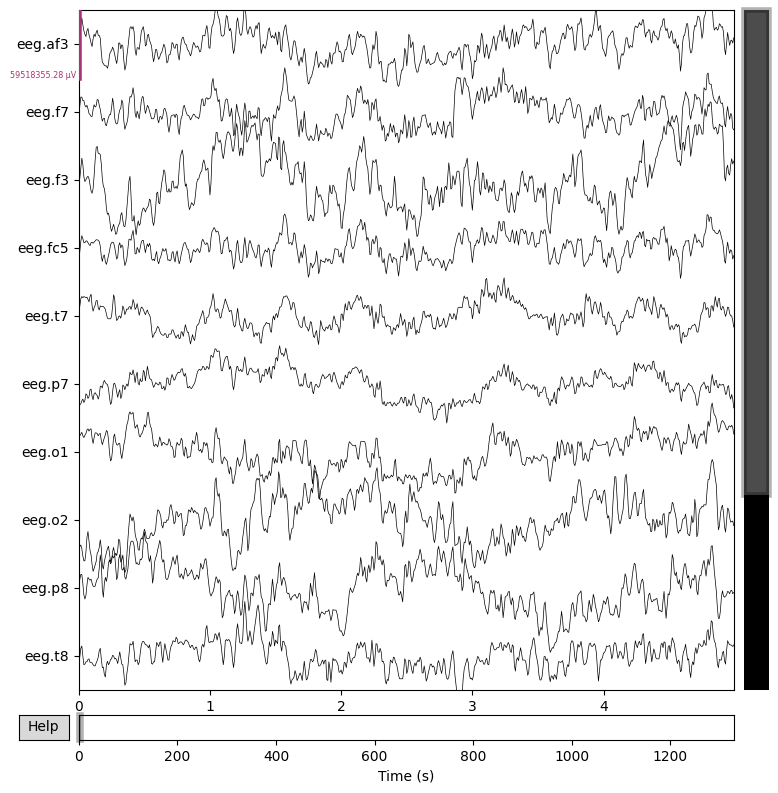

Creating RawArray with float64 data, n_channels=14, n_times=141087
    Range : 0 ... 141086 =      0.000 ...  1102.234 secs
Ready.
Респондент 1


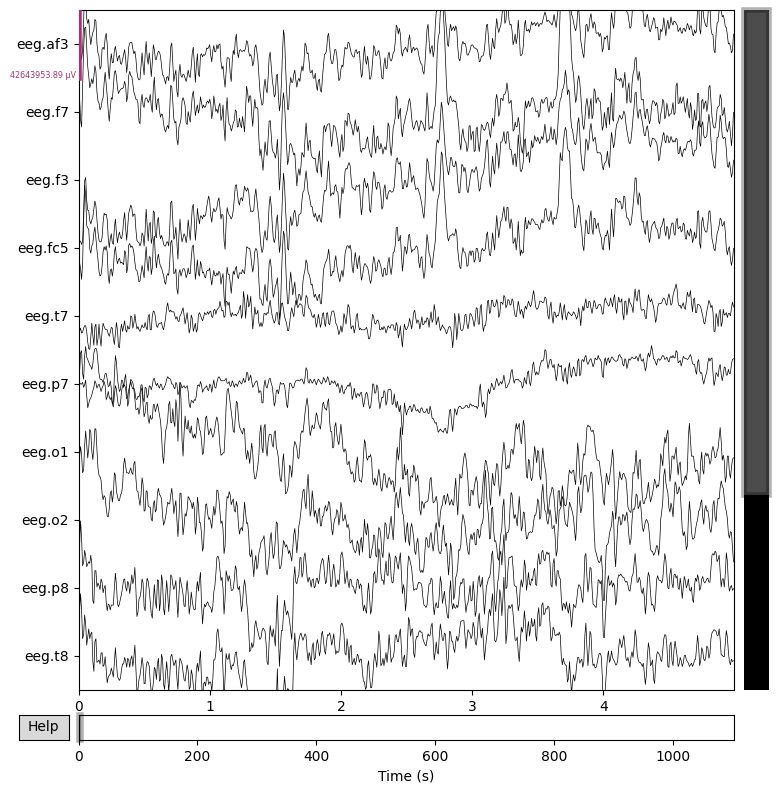

Creating RawArray with float64 data, n_channels=14, n_times=144609
    Range : 0 ... 144608 =      0.000 ...  1129.750 secs
Ready.
Респондент 10


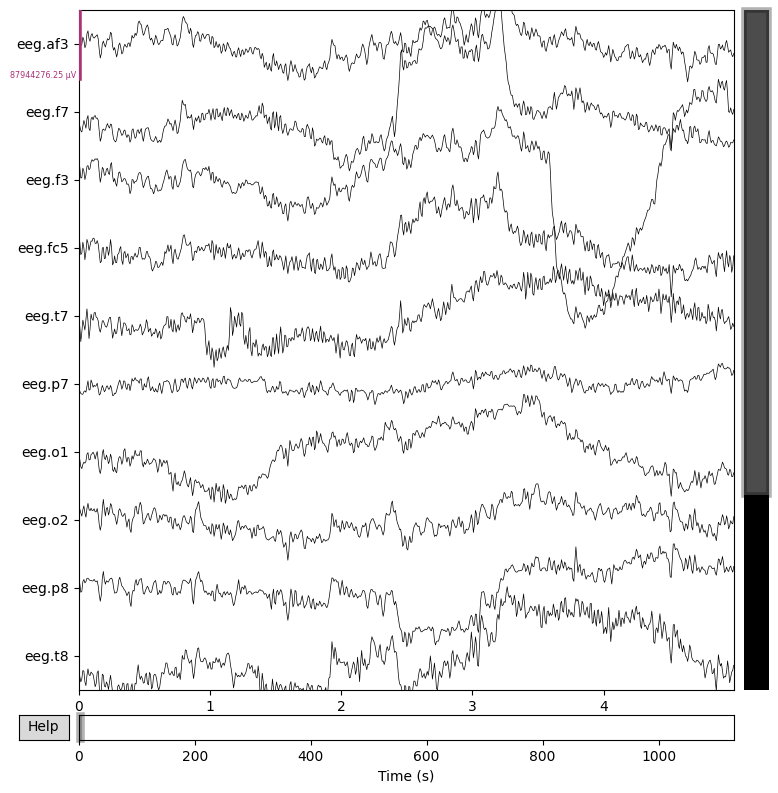

Creating RawArray with float64 data, n_channels=14, n_times=144664
    Range : 0 ... 144663 =      0.000 ...  1130.180 secs
Ready.
Респондент 11


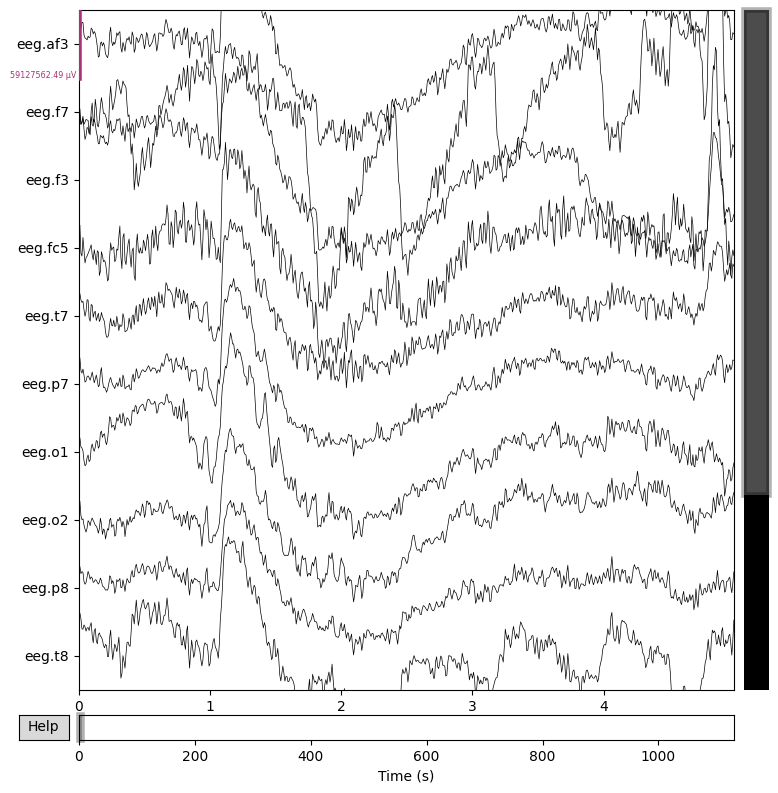

Creating RawArray with float64 data, n_channels=14, n_times=161602
    Range : 0 ... 161601 =      0.000 ...  1262.508 secs
Ready.
Респондент 12


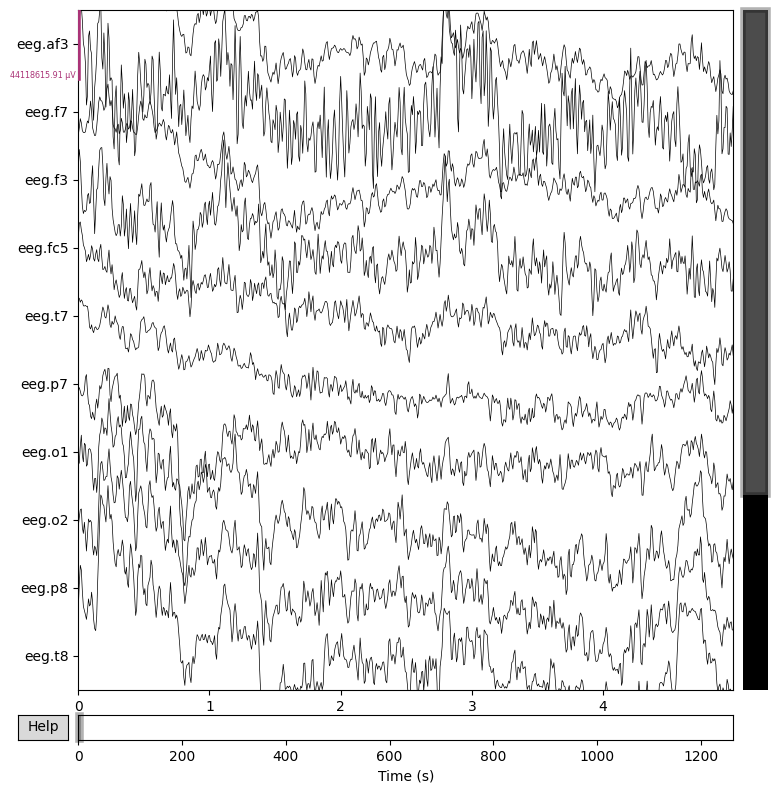

Creating RawArray with float64 data, n_channels=14, n_times=134882
    Range : 0 ... 134881 =      0.000 ...  1053.758 secs
Ready.
Респондент 13


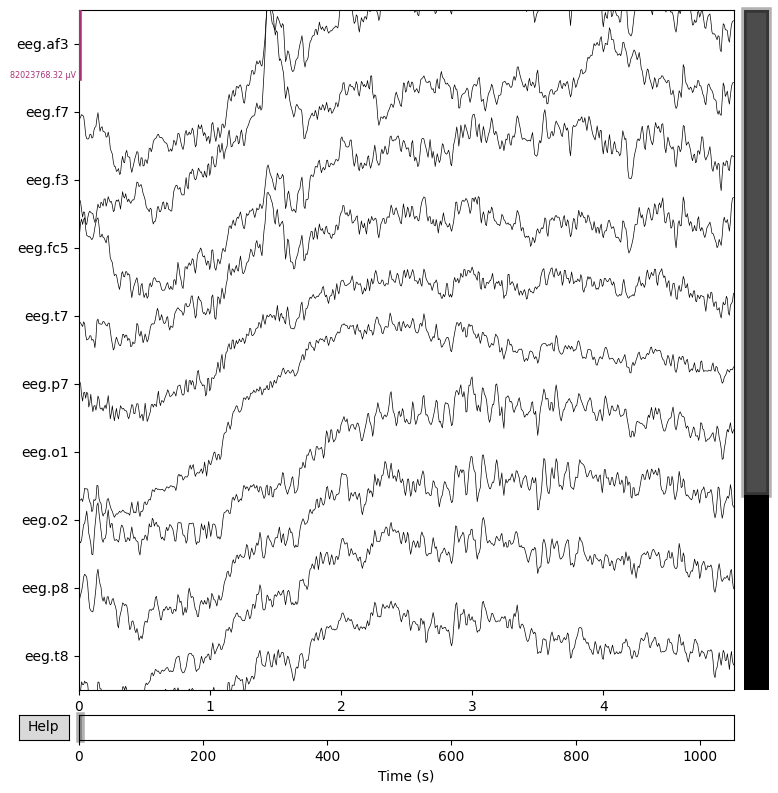

Creating RawArray with float64 data, n_channels=14, n_times=141803
    Range : 0 ... 141802 =      0.000 ...  1107.828 secs
Ready.
Респондент 14


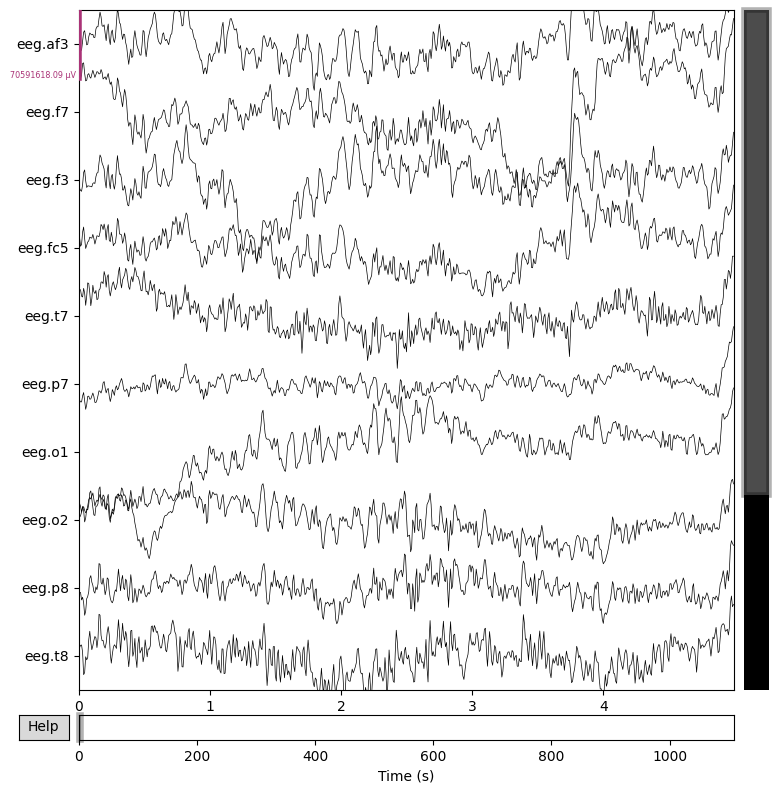

Creating RawArray with float64 data, n_channels=14, n_times=133813
    Range : 0 ... 133812 =      0.000 ...  1045.406 secs
Ready.
Респондент 15


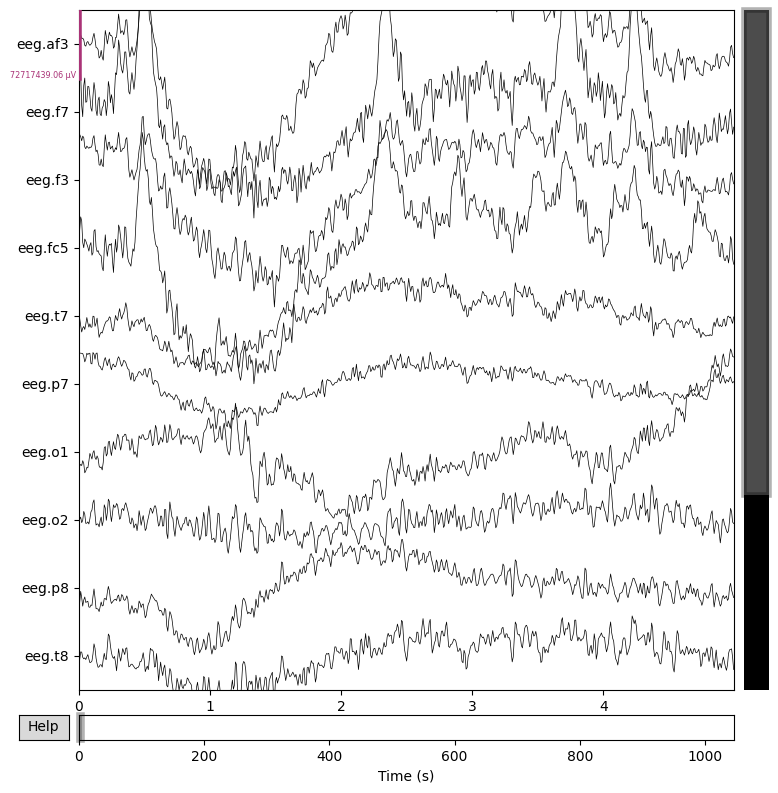

Creating RawArray with float64 data, n_channels=14, n_times=134110
    Range : 0 ... 134109 =      0.000 ...  1047.727 secs
Ready.
Респондент 16


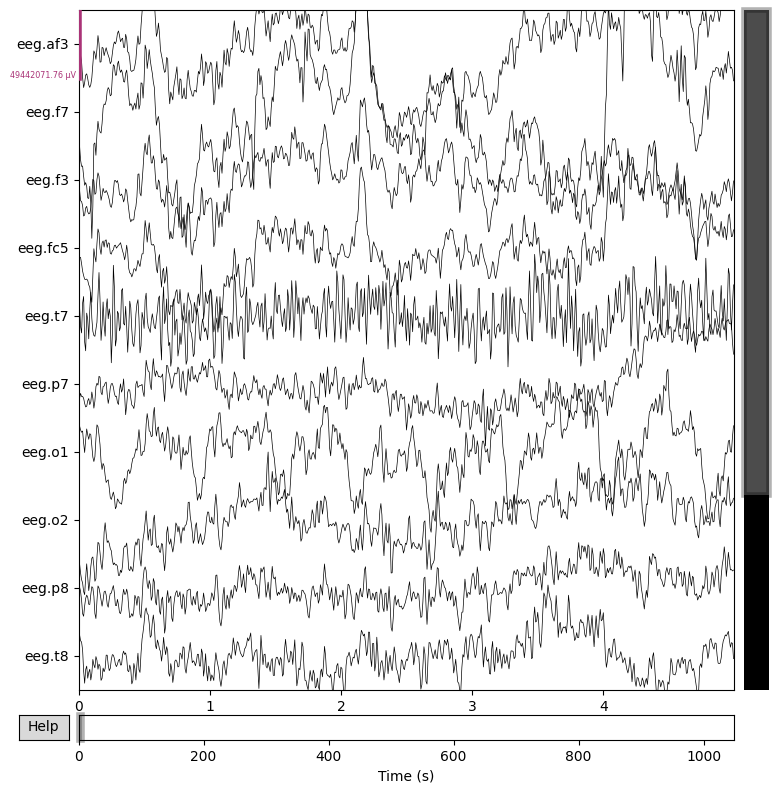

Creating RawArray with float64 data, n_channels=14, n_times=139980
    Range : 0 ... 139979 =      0.000 ...  1093.586 secs
Ready.
Респондент 2


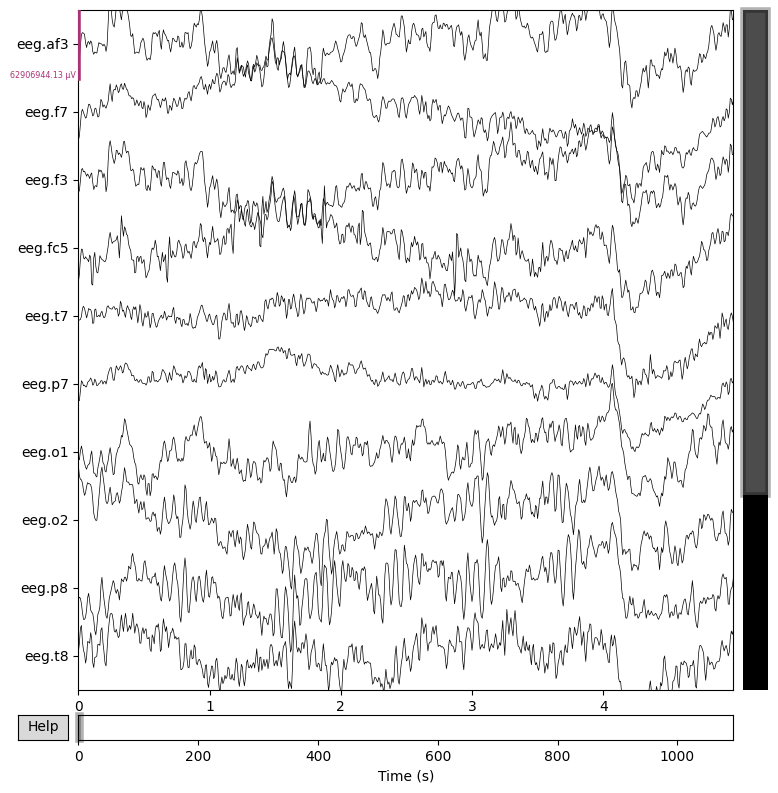

Creating RawArray with float64 data, n_channels=14, n_times=153508
    Range : 0 ... 153507 =      0.000 ...  1199.273 secs
Ready.
Респондент 3


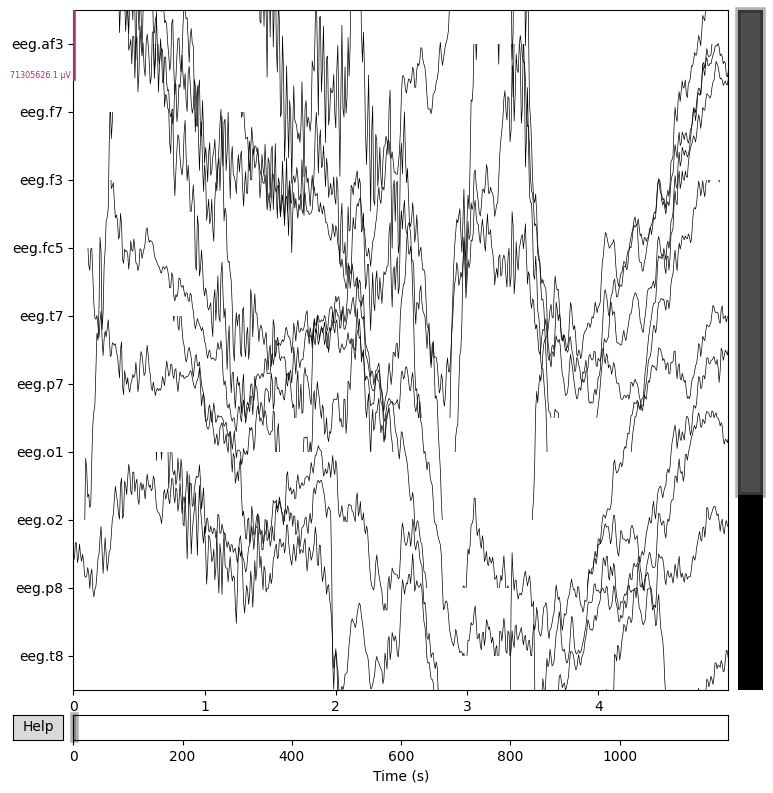

Creating RawArray with float64 data, n_channels=14, n_times=146502
    Range : 0 ... 146501 =      0.000 ...  1144.539 secs
Ready.
Респондент 4


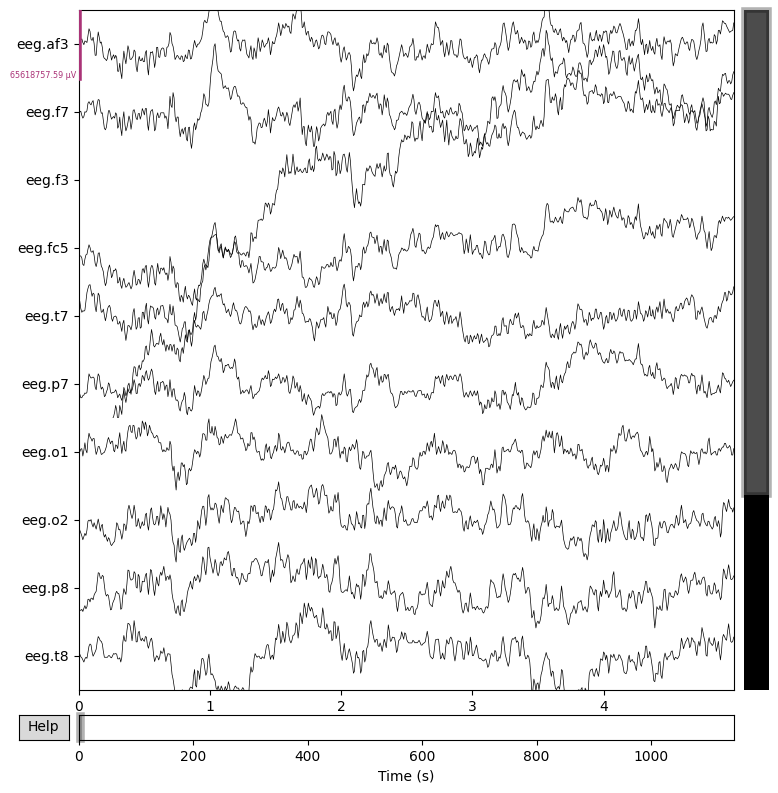

Creating RawArray with float64 data, n_channels=14, n_times=148427
    Range : 0 ... 148426 =      0.000 ...  1159.578 secs
Ready.
Респондент 5


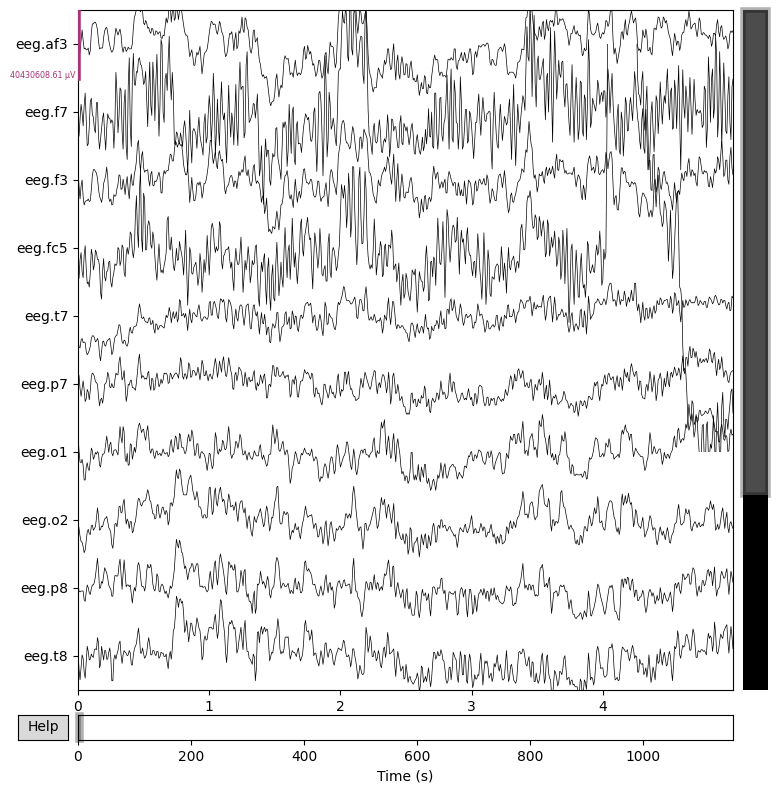

Creating RawArray with float64 data, n_channels=14, n_times=152588
    Range : 0 ... 152587 =      0.000 ...  1192.086 secs
Ready.
Респондент 6


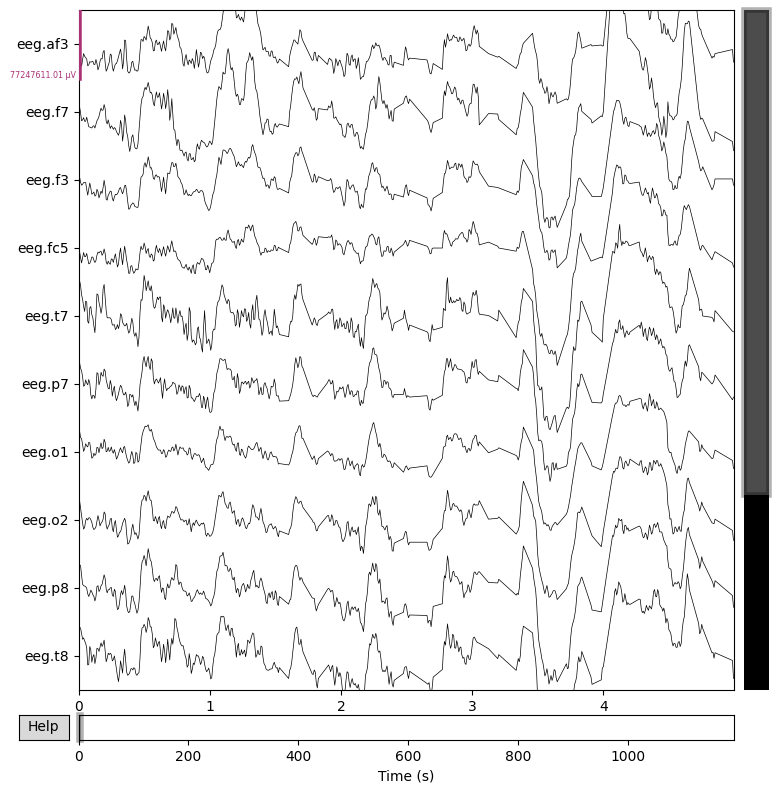

Creating RawArray with float64 data, n_channels=14, n_times=139407
    Range : 0 ... 139406 =      0.000 ...  1089.109 secs
Ready.
Респондент 7


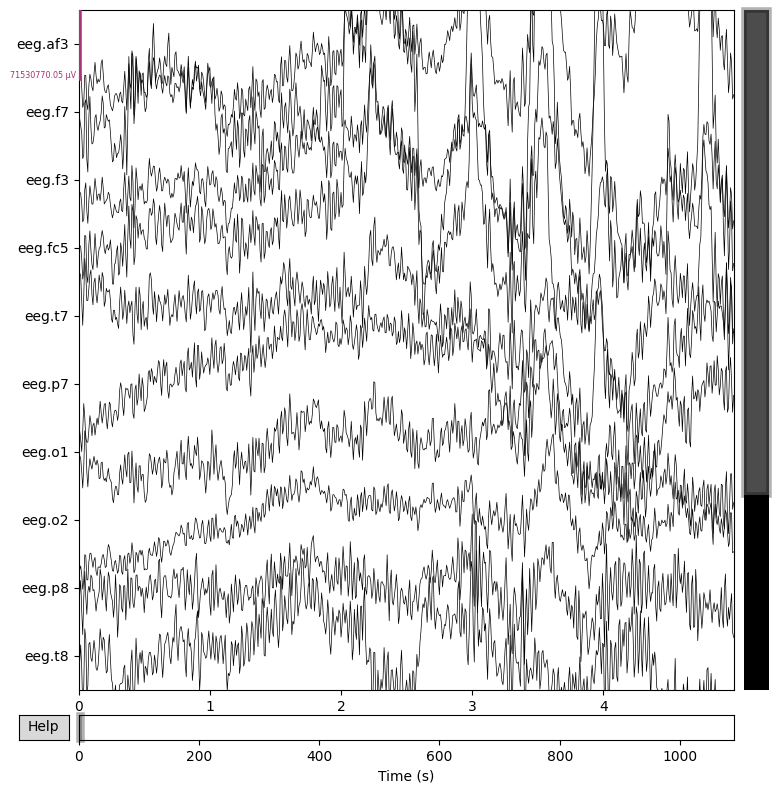

Creating RawArray with float64 data, n_channels=14, n_times=135522
    Range : 0 ... 135521 =      0.000 ...  1058.758 secs
Ready.
Респондент 8


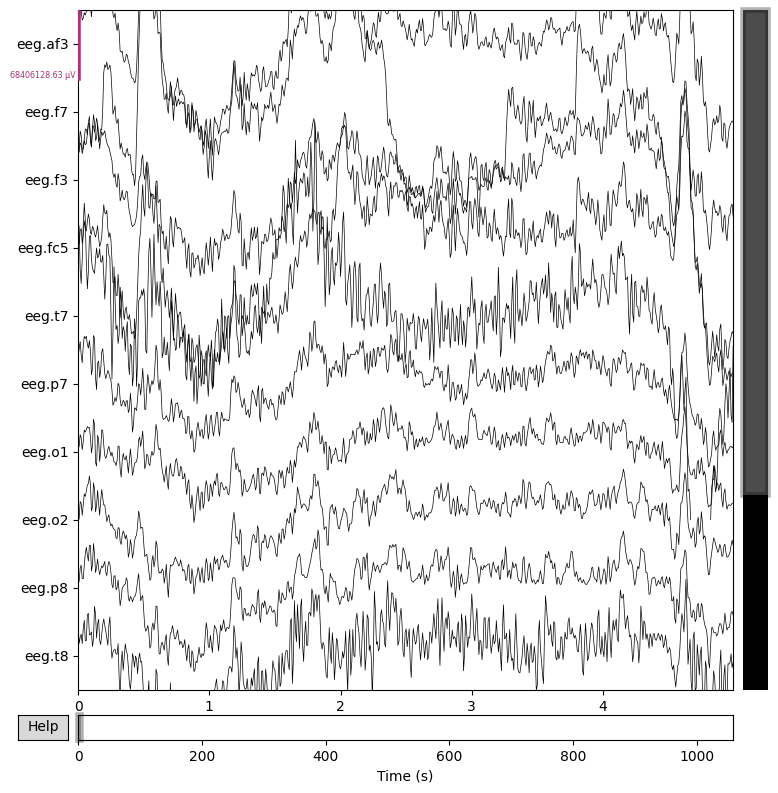

Creating RawArray with float64 data, n_channels=14, n_times=137660
    Range : 0 ... 137659 =      0.000 ...  1075.461 secs
Ready.
Респондент 9


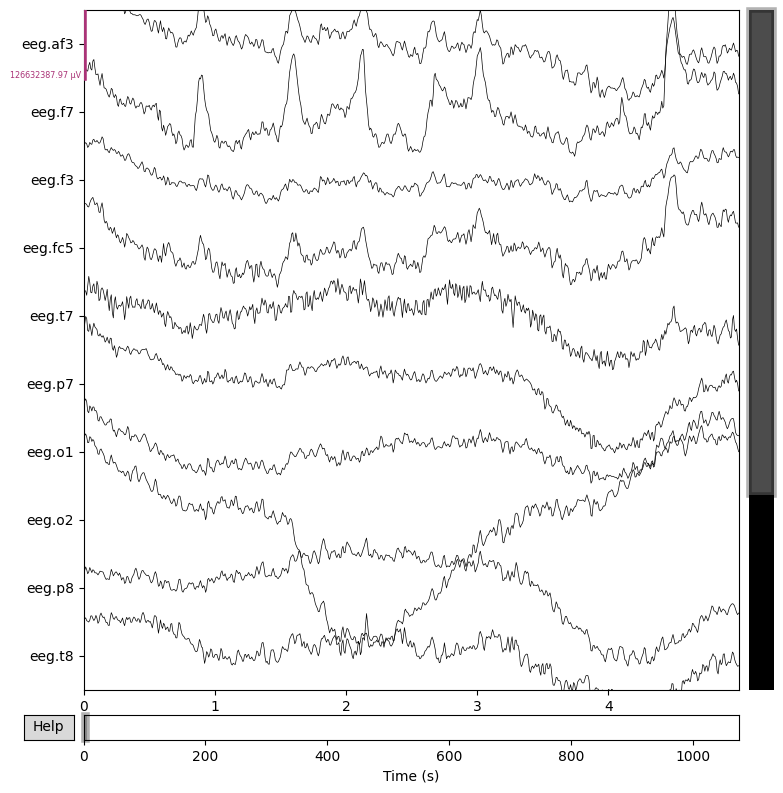

In [15]:
sfreq = 128

for sid, data_dict in subjects_data.items():
    raw_df = data_dict.get('raw')
    if raw_df is None:
        continue

    eeg_channels = [c for c in raw_df.columns if c.startswith('eeg.') and c not in ['eeg.counter', 'eeg.interpolated','eeg.battery', 'eeg.batterypercent', 'eeg.markerhardware', 'eeg.rawcq']]

    data = raw_df[eeg_channels].T.values

    info = mne.create_info(ch_names=eeg_channels, sfreq=sfreq, ch_types='eeg')
    raw_mne = mne.io.RawArray(data, info)

    print(f'Респондент {sid}')
    raw_mne.plot(duration=5, n_channels=10, scalings='auto')

In [16]:
for sid, data_dict in subjects_data.items():
    if sid == '0':
        continue

    marker_df = data_dict['marker']

    print(f"Респондент {sid}:")
    print(marker_df['type'].unique())
    print('-' * 50)

Респондент 1:
['sensor_check' 'published_date' 'phase_calibration' 'sound_check'
 'phase_Instructions' 'text_instructions' 'CQ' 'phase_Calibration_phase_1'
 'eyesclose_calibration' 'active_period' 'phase_VK_JAPAN' 'RELAX'
 'VK_JAPAN_INFO' 'VK_JAPAN_COM' 'VK_JAPAN_THR'
 'phase_Calibration_phase__2' 'phase_TG_JAPAN_' 'TG_JAPAN_INFO'
 'TG_JAPAN_COM' 'TG_JAPAN_THR' 'phase_Calibration_phase__3'
 'phase_TG_MUSK' 'TG_MASK_INFO' 'TG_MUSK_COM' 'TG_MUSK_THR'
 'phase_Calibration_phase_4' 'phase_VK_MUSK' 'VK_MASK_INFO' 'VK_MUSK_COM'
 'VK_MUSK_THR' 'phase_Calibration_phase_5' 'phase_VK_BORISOV'
 'VK_BORISOV_INFO' 'VK_BORISOV_COM' 'VK_BORISOV_THR'
 'phase_Calibration_phase_6' 'phase_TG_BORISOV' 'TG_BORISOV_INFO'
 'TG_BORISOV_COM' 'TG_BORISOV_THR' 'phase_Calibration_phase_7'
 'phase_TG_EGE' 'TG_EGE_INFO' 'TG_EGE_COM' 'TG_EGE_THR_1' 'TG_EGE_THR_2'
 'phase_Calibration_phase_8' 'phase_VK_EGE_' 'VK_EGE_INFO' 'VK_EGE_COM'
 'last_stimuli' 'phase_Instructions_phase_1' 'text_element_nzmg'
 'finish_running']


У всех респондентов совпадают стимулы. Расположим их в правильном порядке. Итого 24 события.

In [17]:
TIMELINE = [
    'VK_JAPAN_INFO', 'VK_JAPAN_COM', 'VK_JAPAN_THR',
    'TG_JAPAN_INFO', 'TG_JAPAN_COM', 'TG_JAPAN_THR',
    'TG_MUSK_INFO', 'TG_MUSK_COM', 'TG_MUSK_THR',
    'VK_MUSK_INFO', 'VK_MUSK_COM', 'VK_MUSK_THR',
    'VK_BORISOV_INFO', 'VK_BORISOV_COM', 'VK_BORISOV_THR',
    'TG_BORISOV_INFO', 'TG_BORISOV_COM', 'TG_BORISOV_THR',
    'TG_EGE_INFO', 'TG_EGE_COM','TG_EGE_THR_1', 'TG_EGE_THR_2',
    'VK_EGE_INFO', 'VK_EGE_COM'
]

Так же обнаружены опечатки в исходных данных. Считаем их за опечатки, так как в описании задания имеется список хронологии событий. Заменим  'VK_MASK_INFO' на 'VK_MUSK_INFO'и'TG_MASK_INFO' на 'TG_MUSK_INFO'.

In [18]:
fix_mistake = {
    'VK_MASK_INFO': 'VK_MUSK_INFO',
    'TG_MASK_INFO': 'TG_MUSK_INFO'
}

for sid, data_dict in subjects_data.items():
    if 'marker' in data_dict:
        marker_df = data_dict['marker']
        marker_df['type'] = marker_df['type'].replace(fix_mistake)

Так же скропируем датафреймы, кроме пилотного респондента, так как он не является информативным для построения ERP графиков.

In [19]:
marker_df = data_dict['marker'].copy()
eeg_df = data_dict['perception_raw'].copy()

Отфильтруем датасеты по списку `TIMELINE` так, чтобы остались только те строки, где указаны интересующие нас события.

In [20]:
for sid, data_dict in subjects_data.items():
    if 'marker' not in data_dict:
        print(f'Респондент {sid} — нет marker данных')
        continue

    marker_df = marker_df[marker_df['type'].isin(TIMELINE)]

    print(f'Респондент {sid}: {len(marker_df)} строк после фильтрации')

Респондент 0 — нет marker данных
Респондент 1: 24 строк после фильтрации
Респондент 10: 24 строк после фильтрации
Респондент 11: 24 строк после фильтрации
Респондент 12: 24 строк после фильтрации
Респондент 13: 24 строк после фильтрации
Респондент 14: 24 строк после фильтрации
Респондент 15: 24 строк после фильтрации
Респондент 16: 24 строк после фильтрации
Респондент 2: 24 строк после фильтрации
Респондент 3: 24 строк после фильтрации
Респондент 4: 24 строк после фильтрации
Респондент 5: 24 строк после фильтрации
Респондент 6: 24 строк после фильтрации
Респондент 7: 24 строк после фильтрации
Респондент 8: 24 строк после фильтрации
Респондент 9: 24 строк после фильтрации


Проведемм предобработку ЭЭГ-сигнала: нарезаем эпохи вокруг стимулов с базовой коррекцией (baseline-corrected), фильтруем (1–40 Гц), убираем сетевые помехи (50 Гц), интерполируем отсутствующие данные и усредняем по каждому респонденту для каждого стимула. После этого выполним гранд-усреднение по всем участникам, чтобы получить итоговые вызванные потенциалы (ERP) для каждого стимула.

In [21]:
tmin, tmax = -0.2, 1.0
baseline = (tmin, 0)
evoked_all = {}

def process_subject(sid, data_dict, eeg_channels, sfreq, TIMELINE):
    '''
    Обработка ЭЭГ-данных и построение Evoked (ERP) для одного респондента.

    Аргументы:
        sid          : идентификатор респондента
        data_dict    : словарь с данными 'perception_raw' и 'marker'
        eeg_channels : список каналов ЭЭГ
        sfreq        : частота дискретизации
        TIMELINE     : список событий для обработки

    Возвращает:
        evoked_subject : словарь Evoked по каждому стимулу
    '''
    eeg_df = data_dict['perception_raw']
    marker_df = data_dict['marker']

    marker_df = marker_df[marker_df['type'].isin(TIMELINE)]

    info = mne.create_info(ch_names=eeg_channels, sfreq=sfreq, ch_types='eeg')
    raw_data = eeg_df[eeg_channels].interpolate().ffill().bfill().values.T
    raw = mne.io.RawArray(raw_data, info)

    raw.filter(1., 40., fir_design='firwin', verbose=False)
    raw.notch_filter(50., verbose=False)
    raw.set_eeg_reference('average')

    raw_start_sec = eeg_df['timestamp'].iloc[0] / 1000
    marker_times_sec = (marker_df['timestamp'].values / 1000) - raw_start_sec
    event_samples = np.array([np.argmin(np.abs(raw.times - t)) for t in marker_times_sec])

    stim_types = marker_df['type'].unique()
    event_id = {stim: i for i, stim in enumerate(stim_types)}
    events = np.column_stack([
        event_samples,
        np.zeros_like(event_samples, dtype=int),
        [event_id[s] for s in marker_df['type']]
    ])

    epochs = mne.Epochs(raw, events, event_id=event_id,
                        tmin=tmin, tmax=tmax, baseline=baseline,
                        preload=True, reject=None, event_repeated='merge',
                        verbose=False)

    evoked_subj = {}
    for stim in stim_types:
        if len(epochs[stim]) > 0:
            evoked_subj[stim] = epochs[stim].average()
    return evoked_subj


for sid, data_dict in subjects_data.items():
    if 'perception_raw' not in data_dict or 'marker' not in data_dict:
        print(f'Респондент {sid} — нет необходимых данных')
        continue

    print(f'- Обрабатываю респондента {sid} -')
    ev_subj = process_subject(sid, data_dict, eeg_channels, sfreq, TIMELINE)
    for stim, ev in ev_subj.items():
        evoked_all.setdefault(stim, []).append(ev)


grand_averages = {}

for stim, ev_list in evoked_all.items():
    grand_averages[stim] = mne.grand_average(ev_list)

Респондент 0 — нет необходимых данных
- Обрабатываю респондента 1 -
Creating RawArray with float64 data, n_channels=14, n_times=136739
    Range : 0 ... 136738 =      0.000 ...  1068.266 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
- Обрабатываю респондента 10 -
Creating RawArray with float64 data, n_channels=14, n_times=141383
    Range : 0 ... 141382 =      0.000 ...  1104.547 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
- Обрабатываю респондента 11 -
Creating RawArray with float64 data, n_channels=14, n_times=141505
    Range : 0 ... 141504 =      0.000 ...  1105.500 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
- Обрабатываю респондента 12 -
Creating RawArray with float64 data, n_channels=14, n_times=156976
    Range : 0 ... 156975 =      0.000 ...  122

Построим цветные графики.

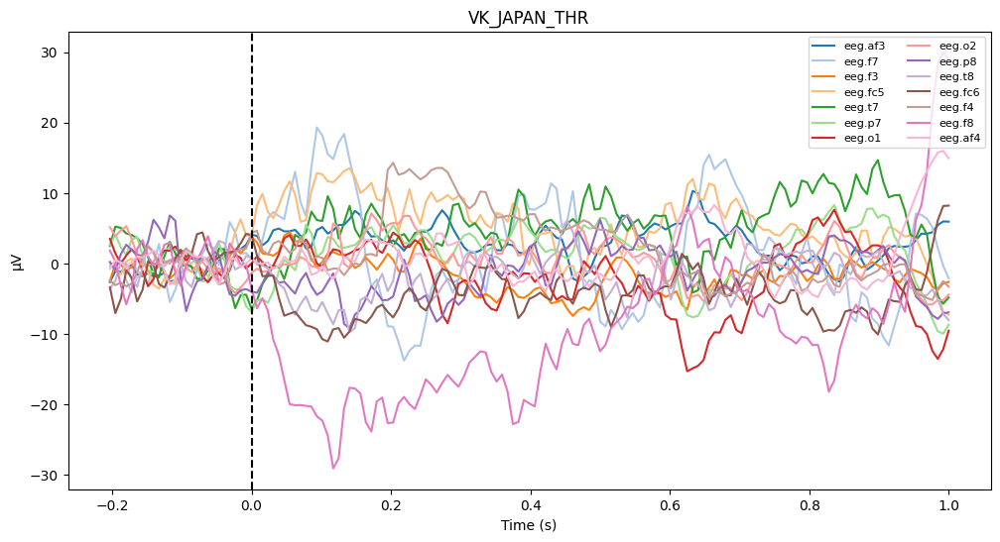

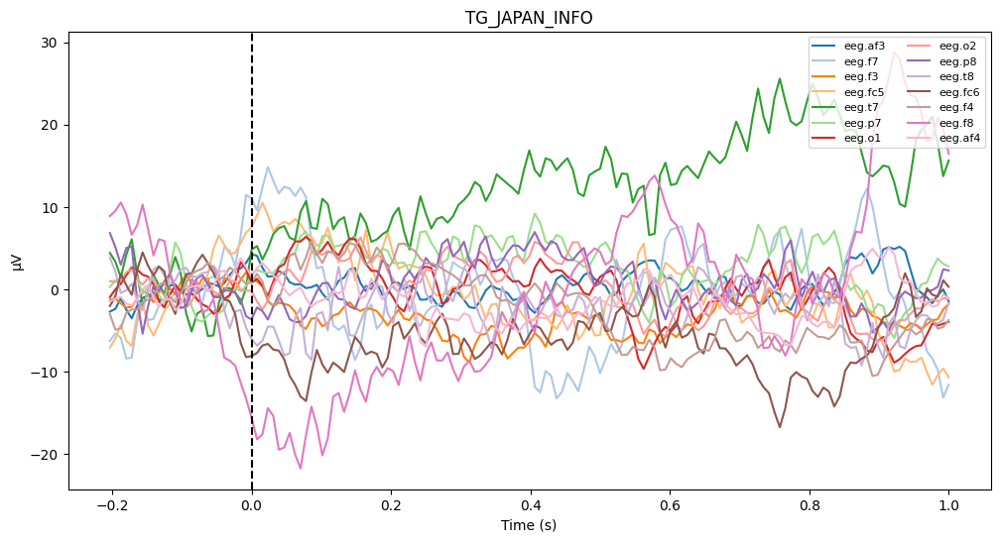

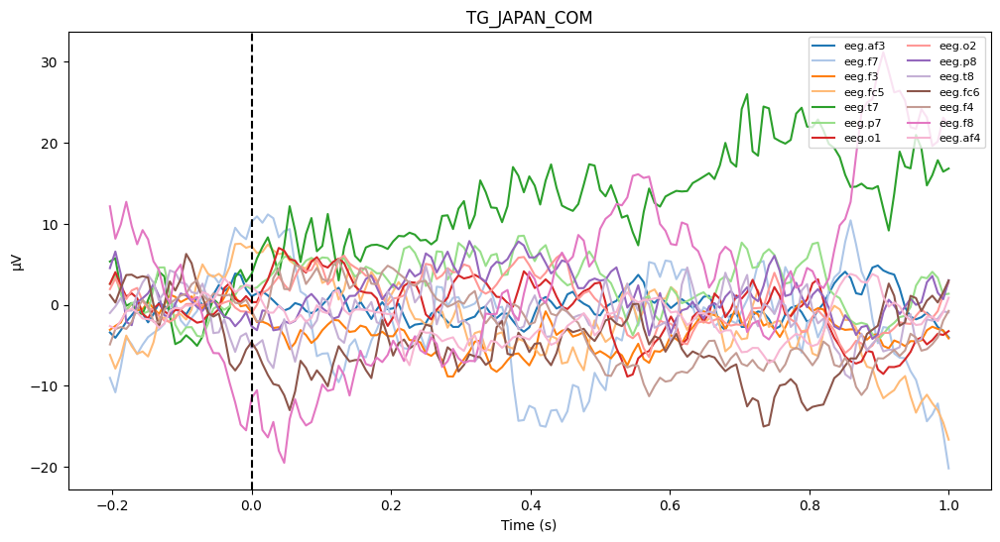

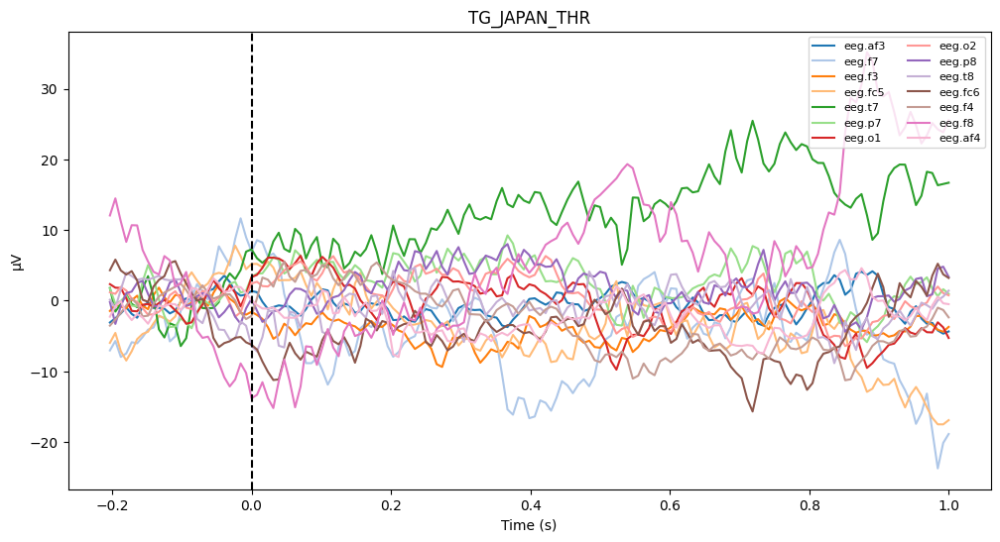

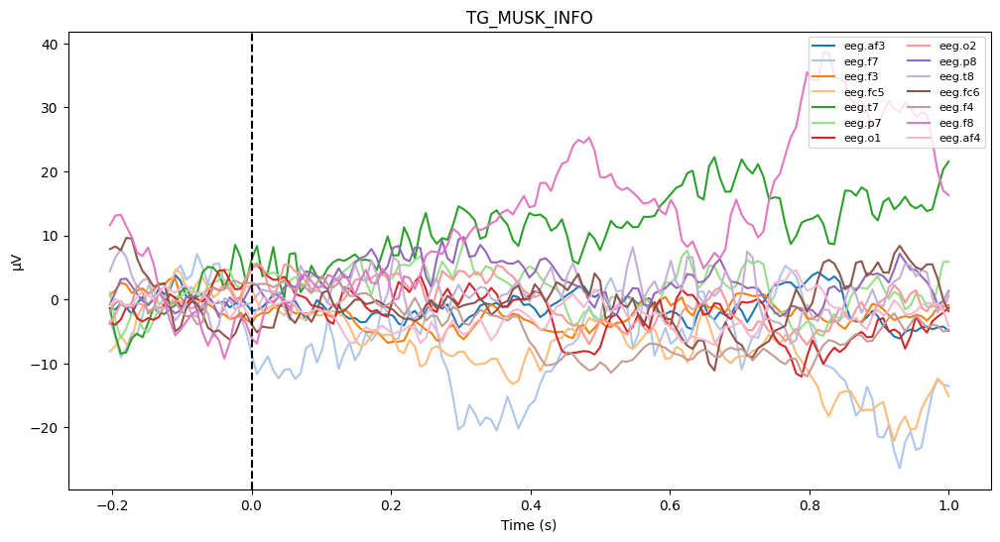

...

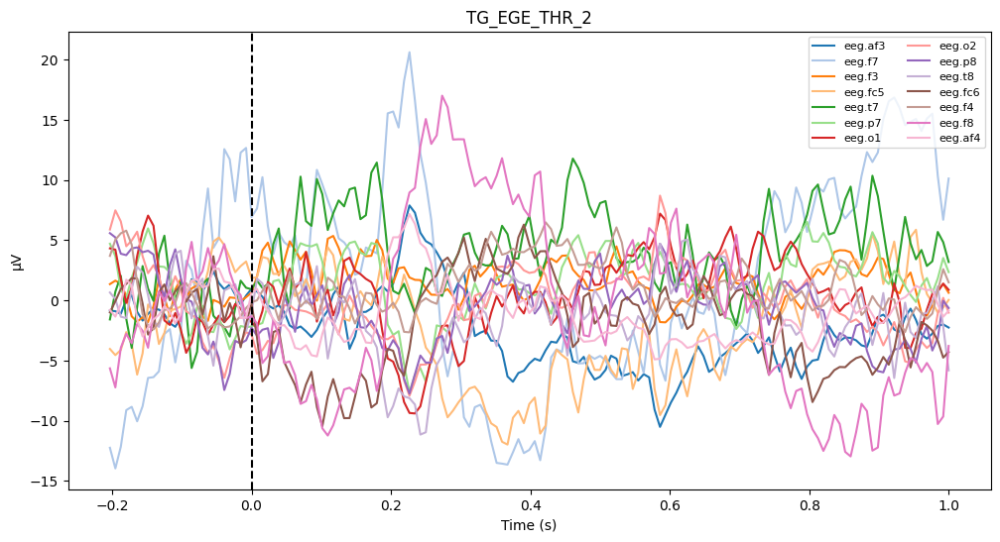

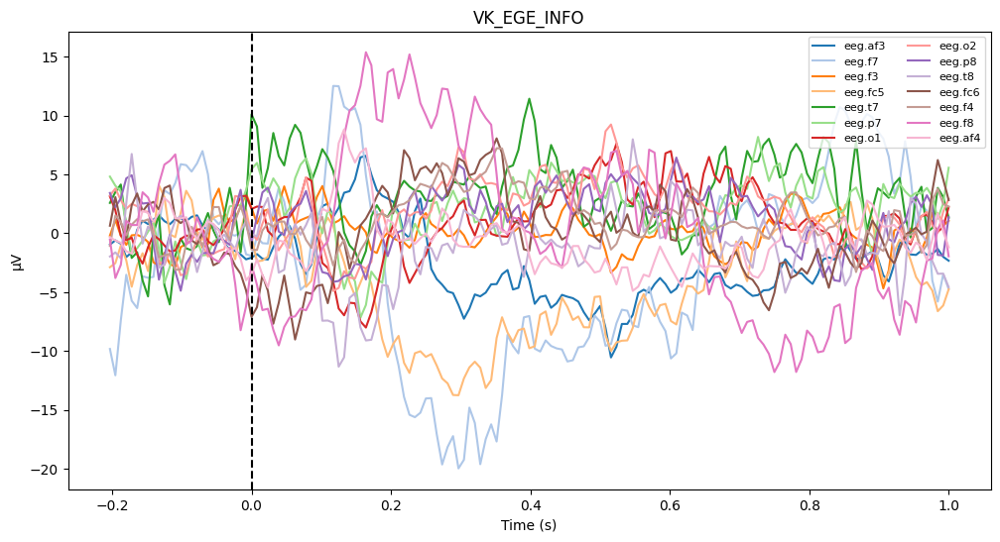

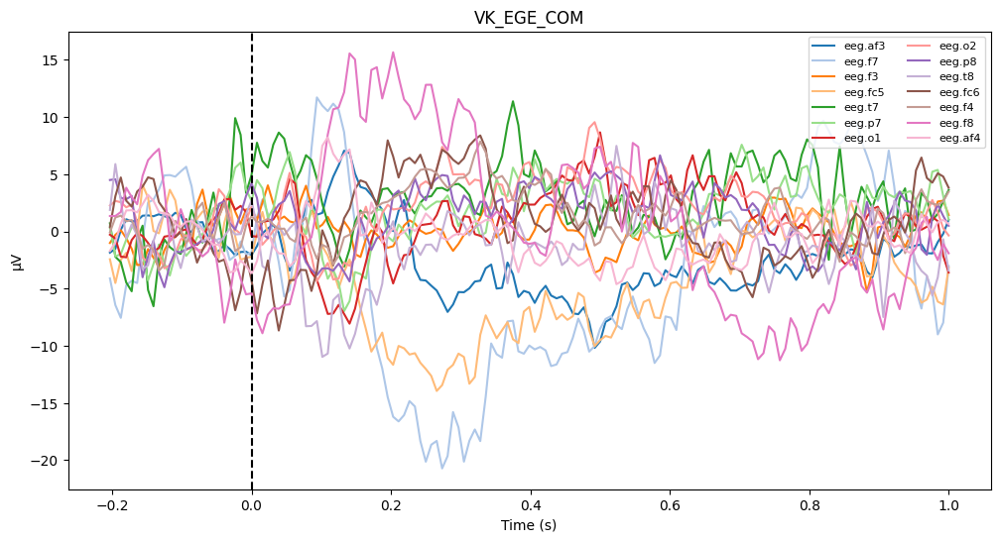

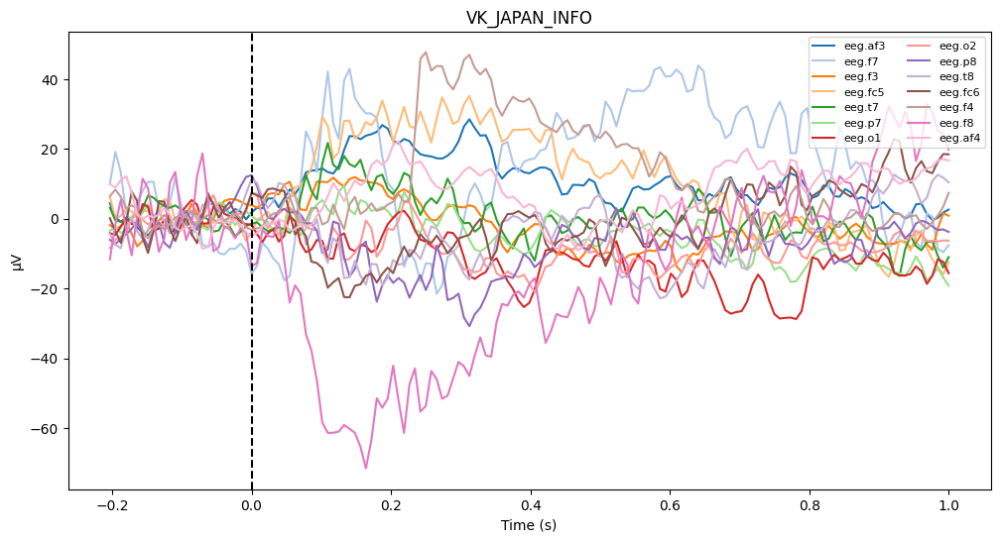

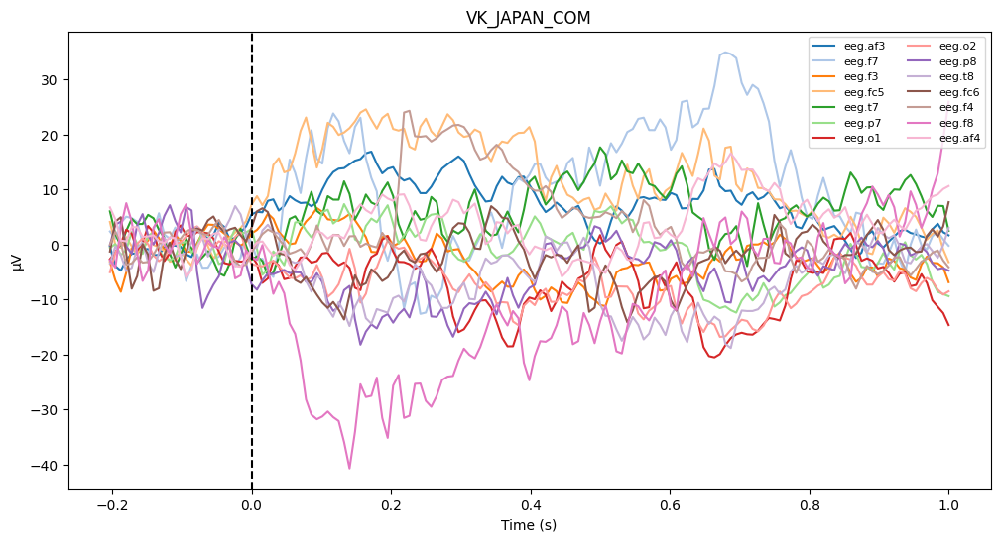

In [22]:
for stim, gav in grand_averages.items():
    if gav is None:
        continue

    fig, ax = plt.subplots(figsize=(12, 6))
    colors = plt.cm.tab20.colors

    for ch_data, ch_name, color in zip(gav.data, gav.ch_names, colors):
        ax.plot(gav.times, ch_data, color=color, label=ch_name)

    ax.axvline(0, color='k', linestyle='--')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('µV')
    ax.set_title(f'{stim}')
    ax.legend(loc='upper right', fontsize=8, ncol=2)
    plt.show()

### Промежуточный вывод

**Цель:** построить  ERP-графики для каждого
стимула для всех респондентов
1. Построены графики сырых данных, определен список актуальных EEG каналов.
2. Определены 24 уникальных стимула событий в списке `TIMELINE`, исправлены опечатки.
3. Задана функция `process_subject`, внутри которой проходит фильтрация данных по стимулам, фильтрация частот, интерполяция.
4. В циклах усреднение значений по каждому респонденту.
5. Построены ERP-графики для каждого стимула.


## Задача 2. Графики по эмоциям.

Берем сырые данные из датафреймов `raw`. Нас интересуют столбцы `PM.Attention.Scaled`,`PM.Engagement.Scaled`, `PM.Excitement.Scaled`, `PM.Stress.Scaled`, `PM.Relaxation.Scaled`, `PM.Interest.Scaled`, `PM.Focus.Scaled`.

In [23]:
metrics = [
    'pm.attention.scaled','pm.engagement.scaled','pm.excitement.scaled',
    'pm.stress.scaled','pm.relaxation.scaled','pm.interest.scaled','pm.focus.scaled'
]

baseline_window = 2.0
resample_dt = 0.1
stimulus_window = 2.0

Для синхронизации маркеров с сырым `raw`, создадим колонку time_sec в которой будет производиться отсчет времени в секундах с начала, до конца измерений. Для этого нужно из каждого значения timestamp вычесть минимальное значение столбца timestamp в этом датафрейме, чтобы получить время относительно начала записи.

Определим функции для предобработки и подготовки данных ЭЭГ:

- `ensure_time_columns`: конвертирует колонку `timestamp` в datetime, сортирует данные по времени и добавляет колонку `time_sec` с временем в секундах относительно начала записи.

- `extract_segment_for_marker`: выделяет сегмент данных вокруг конкретного маркера (`marker_row`) с указанным окном `stimulus_window`, добавляет время относительно начала стимуляции (`time_rel`), идентификатор стимула (`stimulus`) и идентификатор субъекта (`subj`).

- `resample_segment`: ресемплирует выбранный сегмент по заданной сетке времени `t_grid` с интерполяцией указанных метрик `metrics`, возвращая DataFrame с равномерной временной сеткой и соответствующими значениями метрик.


In [24]:
def ensure_time_columns(raw_df):
    """Конвертируем timestamp в datetime, сортируем и добавляем time_sec"""
    raw_df['timestamp'] = pd.to_datetime(raw_df['timestamp'], errors='coerce', unit='s')
    raw_df = raw_df.sort_values('timestamp').reset_index(drop=True)
    raw_df['time_sec'] = (raw_df['timestamp'] - raw_df['timestamp'].min()).dt.total_seconds()
    return raw_df


def extract_segment_for_marker(raw_df, marker_row, stimulus_window):
    """Выделяем сегмент вокруг маркера с временем относительно начала и идентификаторов"""
    start = float(marker_row['latency'])
    duration = float(marker_row['duration'])
    end = start + duration
    seg_mask = (raw_df['time_sec'] >= start - stimulus_window) & (raw_df['time_sec'] <= end + stimulus_window)
    seg = raw_df.loc[seg_mask].copy()
    seg['time_rel'] = seg['time_sec'] - start
    seg['stimulus'] = marker_row['type']
    seg['subj'] = marker_row.get('subj', np.nan)
    return seg


def resample_segment(seg_df, metrics, t_grid):
    """Интерполируем метрики по сетке времени t_grid"""
    out = pd.DataFrame({'time_rel': t_grid})
    for m in metrics:
        tmp = seg_df[['time_rel', m]].dropna().drop_duplicates('time_rel').sort_values('time_rel') if m in seg_df.columns else pd.DataFrame()
        out[m] = np.interp(t_grid, tmp['time_rel'], tmp[m]) if len(tmp) > 1 else np.full_like(t_grid, np.nan, dtype=float)
    return out

Обрабатываем и агрегируем сегменты данных ЭЭГ: для каждого субъекта из `subjects_data` фильтруем пустые или отсутствующие данные, затем с помощью функции `ensure_time_columns` конвертируем время и добавляем колонку `time_sec`. Для каждого маркера из `TIMELINE` выделяем сегменты функцией `extract_segment_for_marker`, добавляем их в список `all_segments` и обновляем максимальную длительность стимуляции. Далее создаём временную сетку `t_grid` с учётом `baseline_window` и максимальной длительности. Сегменты ресемплируем по этой сетке функцией `resample_segment` и организуем по стимулу и субъекту в `per_stim_per_subj`. После этого усредняем метрики по всем субъектам для каждого стимула и вычисляем стандартную ошибку среднего (`SEM`), результаты сохраняем в `average_data`.

In [25]:
all_segments = []
global_max_duration = 0.0

for sid, sub_dict in subjects_data.items():
    raw_df, markers_df = sub_dict.get('raw'), sub_dict.get('marker')
    if raw_df is None or markers_df is None or raw_df.empty or markers_df.empty:
        continue

    raw_df = ensure_time_columns(raw_df)

    for _, mrow in markers_df[markers_df['type'].isin(TIMELINE)].iterrows():
        mrow = mrow.copy()
        mrow['subj'] = sid
        seg = extract_segment_for_marker(raw_df, mrow, stimulus_window)
        if seg.empty:
            continue
        all_segments.append(seg)
        global_max_duration = max(global_max_duration, float(mrow['duration']))

t_min = -baseline_window
t_max = global_max_duration
t_grid = np.arange(t_min, t_max + 1e-9, resample_dt)

per_stim_per_subj = {}
for seg in all_segments:
    stim, subj = seg['stimulus'].iloc[0], seg['subj'].iloc[0]
    resampled = resample_segment(seg, metrics, t_grid)
    resampled['stimulus'], resampled['subj'] = stim, subj
    per_stim_per_subj.setdefault(stim, {})[subj] = resampled

with pd.ExcelWriter('preprocessed_data_task2.xlsx', engine='xlsxwriter') as writer:
    for stim, subj_dict in per_stim_per_subj.items():
        for subj, df_seg in subj_dict.items():
            sheet_name = f'{stim}_{subj}'
            sheet_name = sheet_name[:31]
            df_seg.to_excel(writer, sheet_name=sheet_name, index=False)

average_data = {}
for stim, subj_dict in per_stim_per_subj.items():
    df_time = pd.DataFrame({'time_rel': t_grid})
    values_stack = {m: [df_res[m].values for df_res in subj_dict.values()] for m in metrics}

    agg_df = df_time.copy()
    for m in metrics:
        arr = np.vstack(values_stack[m]) if values_stack[m] else np.empty((0, len(t_grid)))
        agg_df[m] = np.nanmean(arr, axis=0) if arr.size > 0 else np.full_like(t_grid, np.nan, dtype=float)
        agg_df[f'{m}_sem'] = stats.sem(arr, axis=0, nan_policy='omit') if arr.size > 0 and arr.shape[0] > 1 else np.full_like(t_grid, np.nan, dtype=float)
    average_data[stim] = agg_df

Строим графики метрик ЭЭГ для каждого стимула с учётом стандартной ошибки среднего.


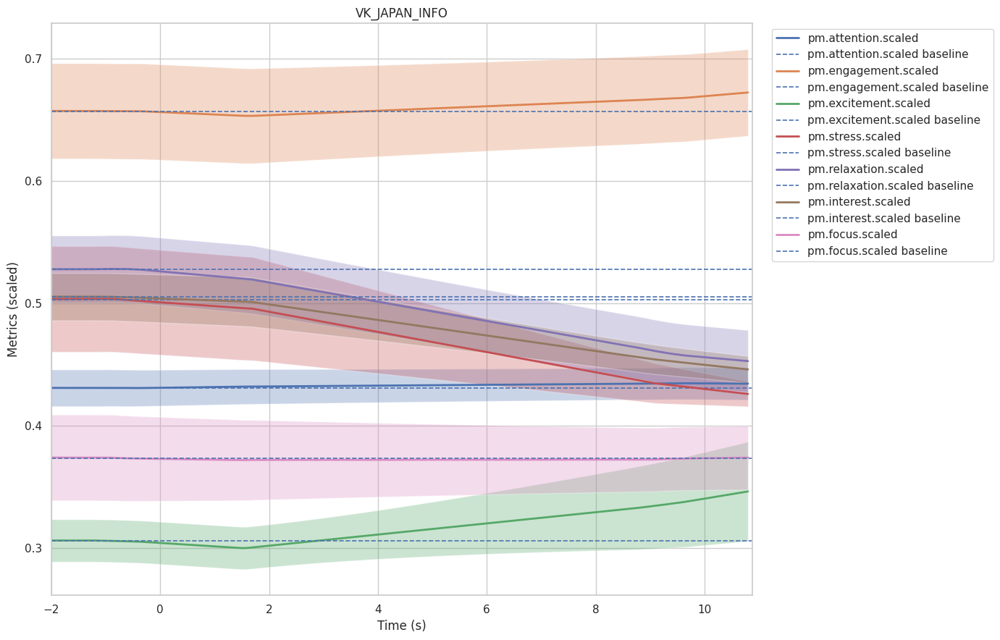

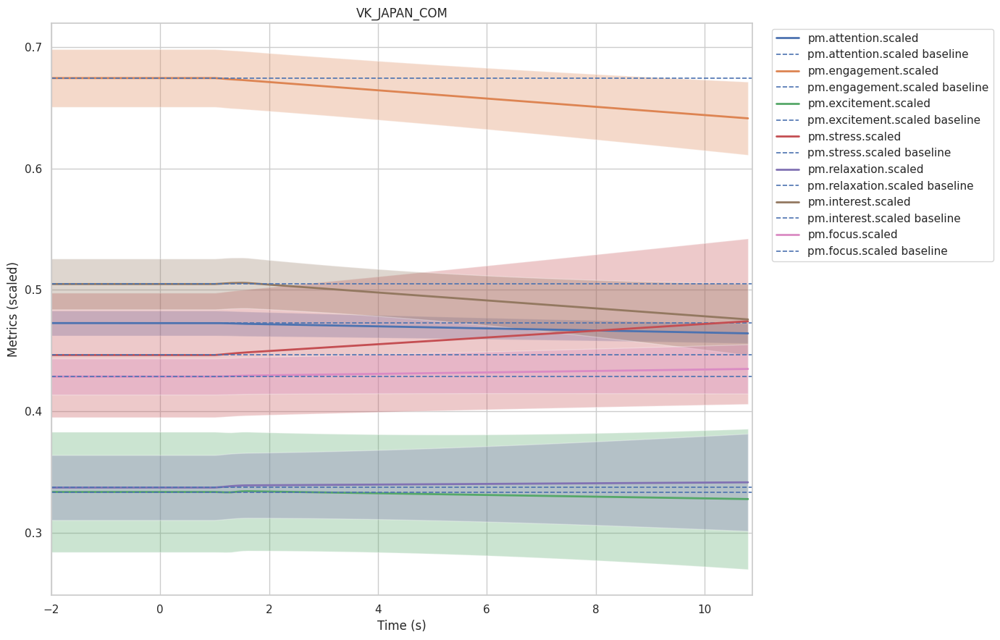

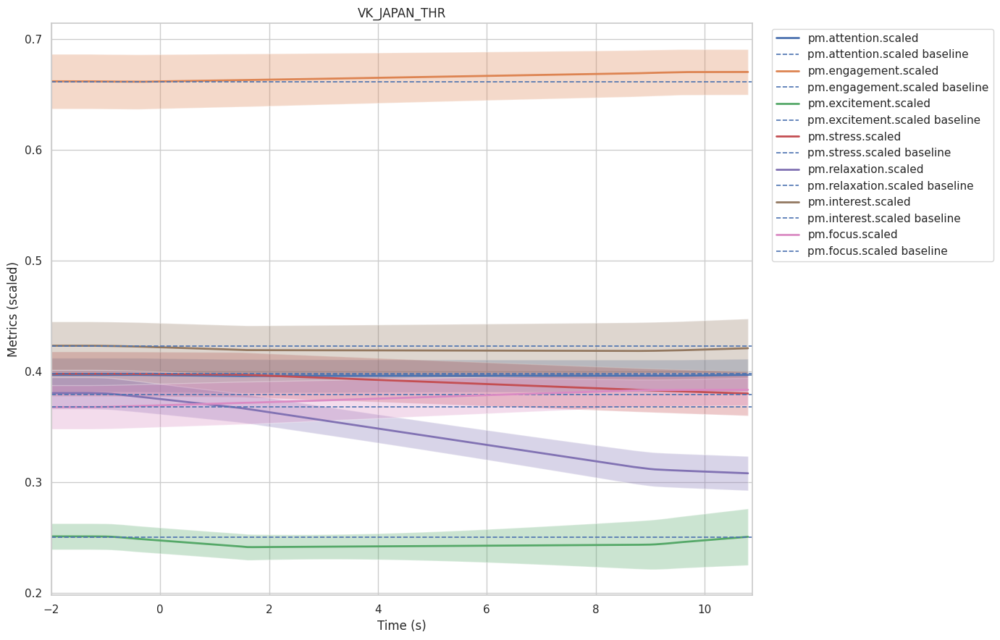

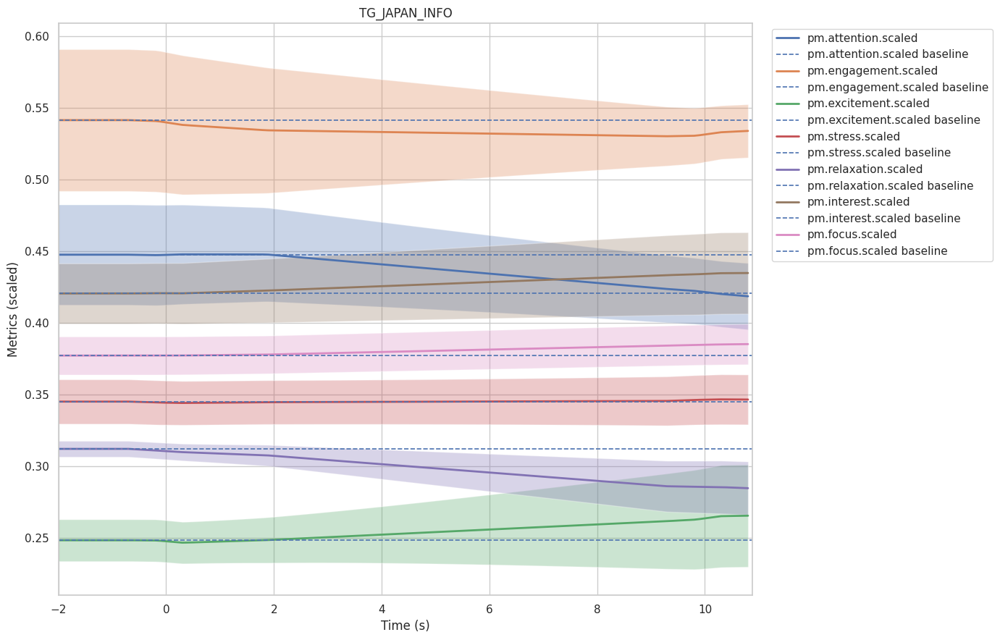

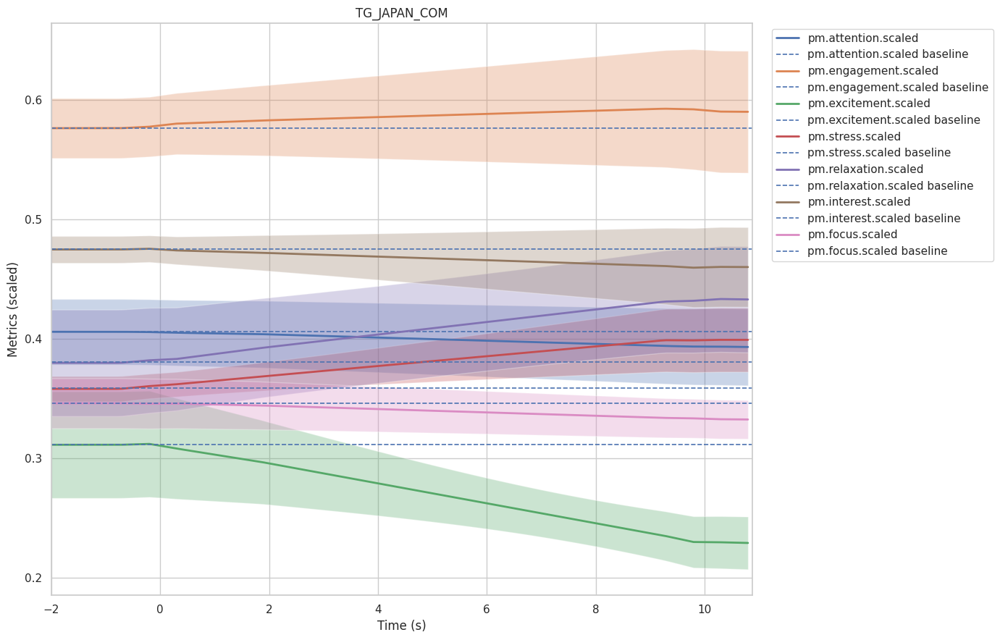

...

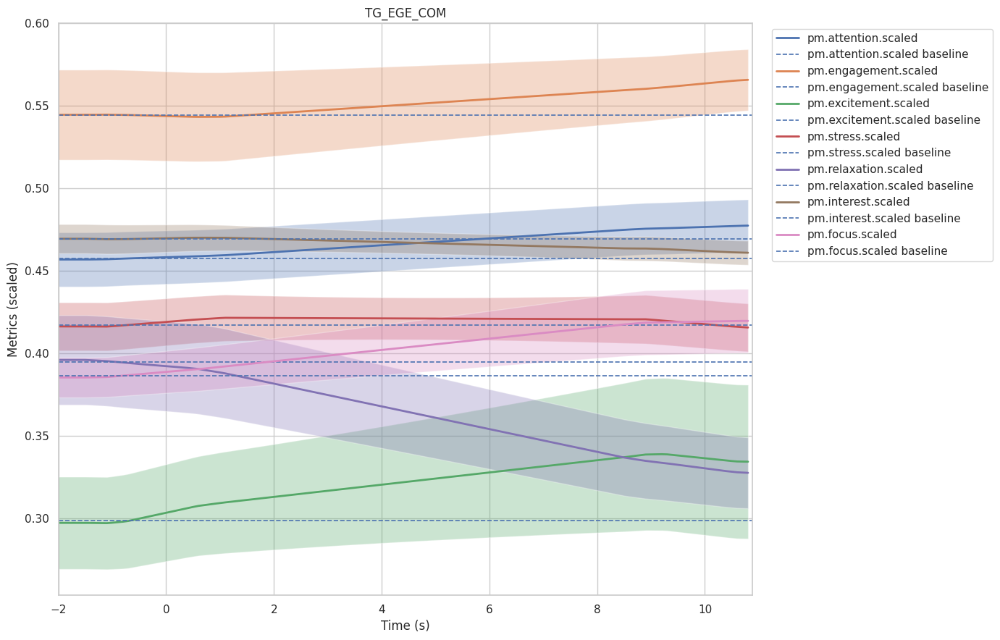

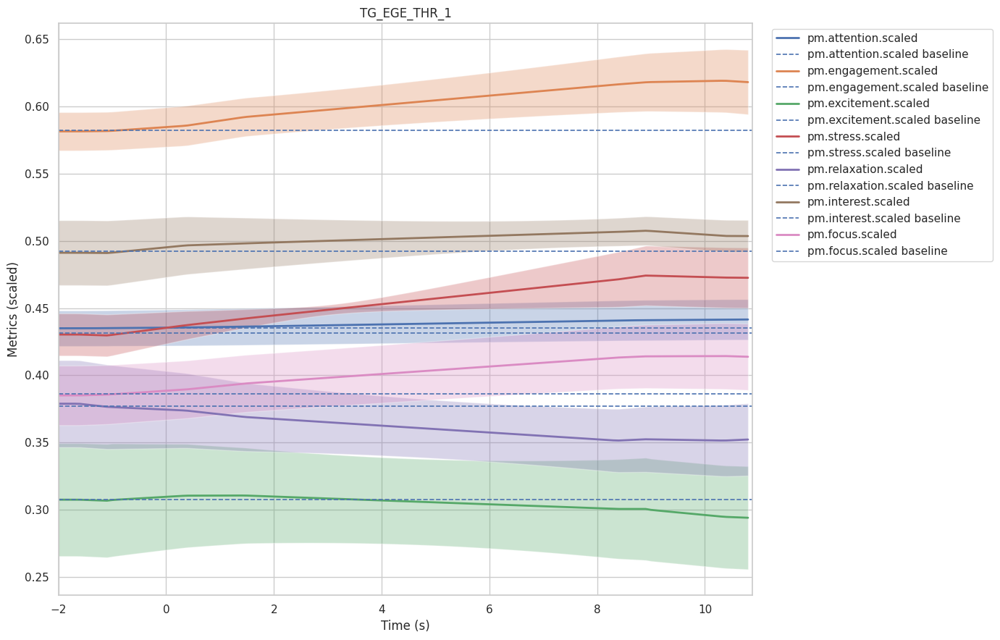

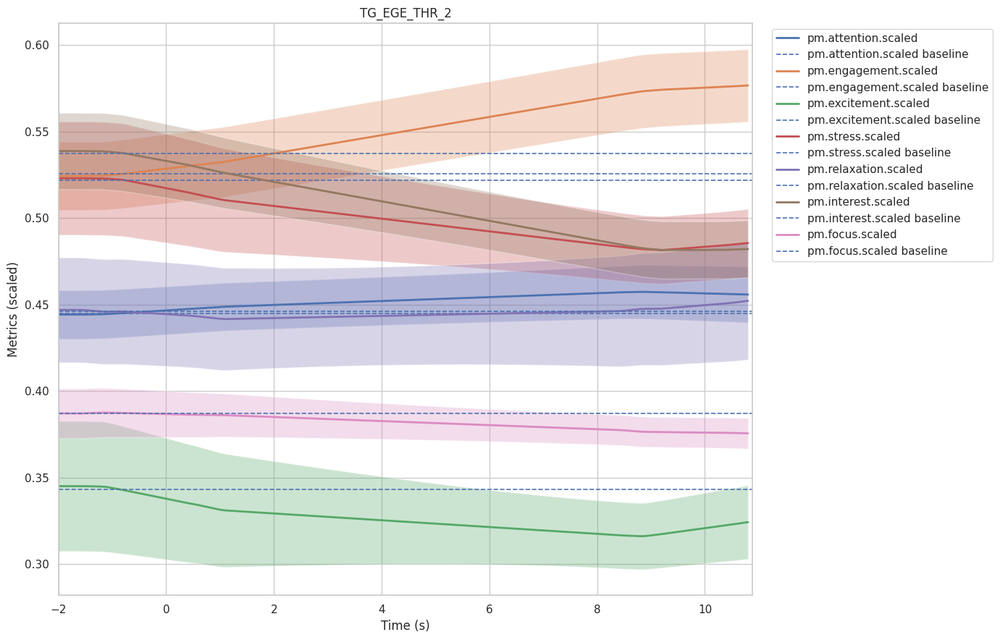

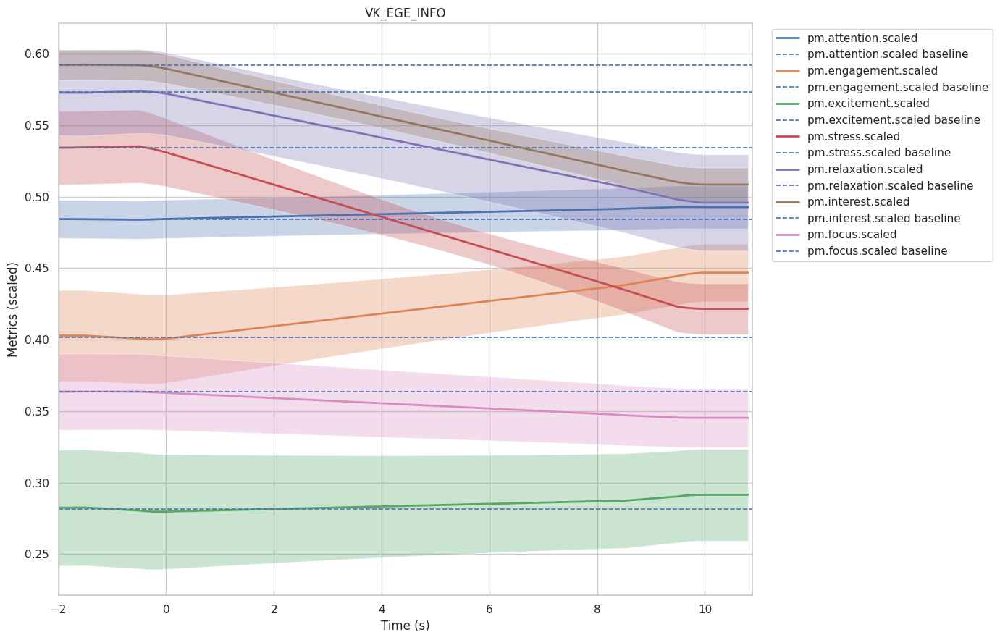

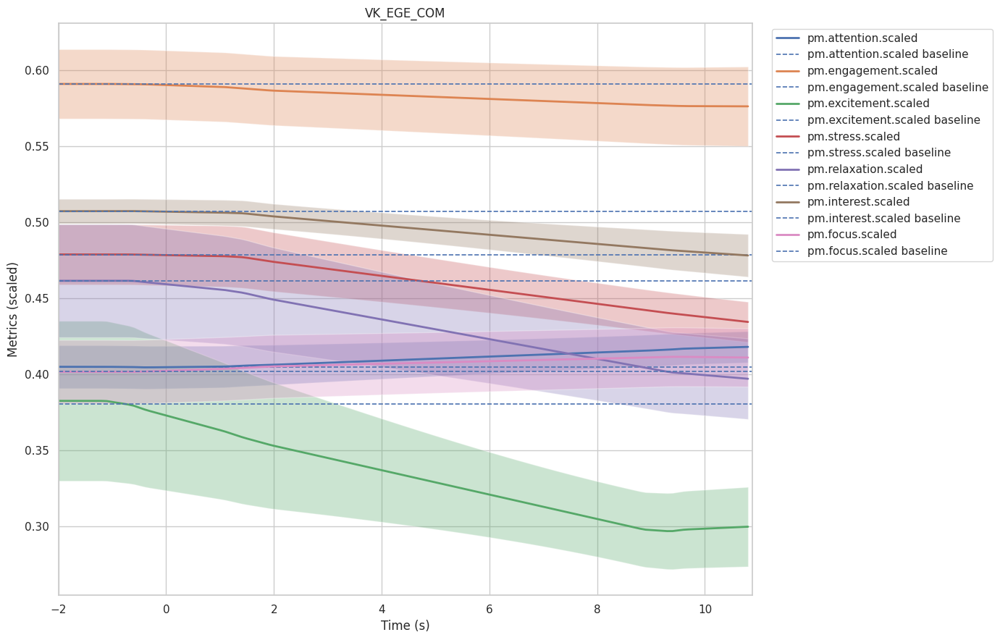

In [27]:
sem_scale = 0.5
alpha = 0.3

sns.set(style='whitegrid')
for stim, df in average_data.items():
    plt.figure(figsize=(14, 9))
    for m in metrics:
        mean, sem = df[m], df[f'{m}_sem']

        mask = ~np.isnan(sem)
        if mask.any():
            plt.fill_between(df['time_rel'][mask],
                             mean[mask] - sem[mask]*sem_scale,
                             mean[mask] + sem[mask]*sem_scale,
                             alpha=alpha)

        plt.plot(df['time_rel'], mean, label=m, linewidth=2)

        baseline_vals = df.loc[df['time_rel'] < 0, m].dropna()
        baseline_val = baseline_vals.mean() if not baseline_vals.empty else 0
        plt.axhline(baseline_val, linestyle='--', linewidth=1.2,
                    label=f'{m} baseline' if not baseline_vals.empty else f'{m} baseline (нет данных)')

    plt.title(f'{stim}')
    plt.xlabel('Time (s)')
    plt.ylabel('Metrics (scaled)')
    plt.xlim(t_min, t_max)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

### Промежуточный вывод

**Цель:** построить графики по эмоциям.
1. Определены метрики, по которым строились графики: attention, engagement,excitement, stress, relaxation, interest, focus.
2. Для подготовки данных созданы функции `ensure_time_columns`, `extract_segment_for_marker`, `resample_segment`, которые конвертируют время, выделяют сегменты вокруг стимулов и синхронизируют метрики по временной сетке.
3. Агрегировали сегменты по участникам и построили 24 графика по стимулам.

# Общий вывод

В ходе выполенния тестового задания было построено 2 типа графиков:
1. ERP - графики.
  * Проведена предобработка данных для каждого респондента: исправлены артефакты, приведены названия столбцов к единому формату, устранены аномалии частоты записи сигналов.
  * Определён список актуальных EEG-каналов и 24 уникальных стимула, исправлены опечатки в названиях стимулов.
  * Для каждого респондента выделены сегменты данных вокруг стимулов с учётом временных меток.
  * Синхронизация данных и фильтрация частот обеспечили корректное усреднение сигналов по каждому стимулу.
  * Построены ERP-графики, демонстрирующие усредненные реакции участников на стимулы, что позволяет анализировать паттерны мозговой активности.
2. Графики по эмоциям.
  * Определены ключевые эмоциональные метрики, выделены сегменты вокруг стимулов.
  * Агрегированы данные по всем респондентам, рассчитаны средние значения и SEM для каждой метрики.
  * Построены графика по стимулам, визуализирующие динамику эмоциональных реакций участников.
